# COLMAP Feasibility Experiments



In [24]:
from pathlib import Path
import os, shutil, sqlite3, struct, subprocess
import numpy as np, pandas as pd, matplotlib.pyplot as plt

In [25]:
COLMAP = r"C:\Users\liter\Documents\ITU_MSc\4thSemester\ResearchProject\colmap-x64-windows-nocuda/COLMAP.bat"


CURATED_ROOT = Path("../data/COLMAP_curated")
CARS_DIR = CURATED_ROOT / "cars"
CURATED_CSV = CURATED_ROOT / "curated_metadata.csv"
RUNS_DIR = Path("../data/COLMAP_curated_runs")
RESULTS_DIR = Path("../data/COLMAP_curated_results")
RUNS_DIR.mkdir(parents=True, exist_ok=True)
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

MIN_IMAGES_PER_CAR = 4
OVERWRITE_RUNS = False
MAX_CARS = None

print("COLMAP exists:", Path(COLMAP).exists())
print("Curated csv exists:", CURATED_CSV.exists())

COLMAP exists: True
Curated csv exists: True


In [26]:
curated_df = pd.read_csv(CURATED_CSV)
display(curated_df.head())

,CARID,PICTUREID,VIEWCLASS,local_image_path,exported_image_name,exported_image_path,PICTURE_GUID,STORAGESYSTEM,STORAGEPATH,WIDTH,...,BRIGHTNESS_STD,R_MEAN,G_MEAN,B_MEAN,SHARPNESS,DOMINANT_COLOR,COLORFULNESS,HIGHLIGHT_RATIO,SHININESS_SCORE,_area
0,12104835,69502105,FRONT,..\data\COLMAP_curated\cars\car_12104835\image...,FRONT_69502105.png,..\data\COLMAP_curated\cars\car_12104835\image...,059ca1b3-34f3-456a-b51b-b65454a99e5f,s3:asysdev-auction-prod-ireland,csp/69/50/21/05/69502105_1.jpg,720.0,...,78.068062,98.067955,97.971779,99.964142,12.413025,gray,6.412599,0.034071,0.119408,228198
1,12104835,69502037,FRONT_LEFT,..\data\COLMAP_curated\cars\car_12104835\image...,FRONT_LEFT_69502037.png,..\data\COLMAP_curated\cars\car_12104835\image...,341d2a45-428f-427c-abdb-b7157156ff25,s3:asysdev-auction-prod-ireland,csp/69/50/20/37/69502037_1.jpg,720.0,...,74.853798,171.526169,171.488449,172.344177,13.482466,gray,6.408598,0.336201,0.272974,225597
2,12104835,69502103,FRONT_RIGHT,..\data\COLMAP_curated\cars\car_12104835\image...,FRONT_RIGHT_69502103.png,..\data\COLMAP_curated\cars\car_12104835\image...,bf447128-0380-478b-ae6a-ab833185e541,s3:asysdev-auction-prod-ireland,csp/69/50/21/03/69502103_1.jpg,720.0,...,83.844269,178.391510,177.055923,175.464828,11.094044,gray,7.728025,0.457515,0.350273,263078
3,12104835,69502118,REAR,..\data\COLMAP_curated\cars\car_12104835\image...,REAR_69502118.png,..\data\COLMAP_curated\cars\car_12104835\image...,2ac1acd0-f7b3-421c-880a-aa4df541b557,s3:asysdev-auction-prod-ireland,csp/69/50/21/18/69502118_1.jpg,720.0,...,77.578568,134.498398,129.502609,129.142715,11.217793,gray,19.777504,0.233183,0.219519,192763
4,12104835,69502116,REAR_LEFT,..\data\COLMAP_curated\cars\car_12104835\image...,REAR_LEFT_69502116.png,..\data\COLMAP_curated\cars\car_12104835\image...,9ea6b5b5-2f2b-48d9-8d91-1c2f9eda3fbc,s3:asysdev-auction-prod-ireland,csp/69/50/21/16/69502116_1.jpg,720.0,...,79.504036,175.811493,168.994095,169.877136,10.317043,gray,31.630175,0.430195,0.330141,256256


In [27]:
eligible_carids = []
for car_dir in sorted(CARS_DIR.glob("car_*")):
    images_dir = car_dir / "images"
    if images_dir.exists() and len([p for p in images_dir.iterdir() if p.is_file()]) >= MIN_IMAGES_PER_CAR:
        eligible_carids.append(car_dir.name.replace("car_", ""))
if MAX_CARS is not None:
    eligible_carids = eligible_carids[:MAX_CARS]
print(len(eligible_carids), eligible_carids[:10])

23 ['12104835', '12165624', '12180881', '24905729', '25476941', '25581194', '25600103', '25652139', '25674001', '25732806']


In [28]:
PARAM_SETS = {

    "exhaustive_loose": {
        "feature_extractor": [
            "--ImageReader.single_camera", "1",
            "--ImageReader.camera_model", "OPENCV",
            "--SiftExtraction.max_num_features", "12000",
            "--SiftExtraction.peak_threshold", "0.0008",
            "--SiftExtraction.edge_threshold", "20",
        ],
        "matcher_cmd": "exhaustive_matcher",
        "matcher_args": [
            "--FeatureMatching.use_gpu", "0",
            "--FeatureMatching.guided_matching", "1",
            "--SiftMatching.cpu_brute_force_matcher", "1",
            "--SiftMatching.max_ratio", "0.95",
            "--SiftMatching.cross_check", "0",
            "--TwoViewGeometry.min_num_inliers", "8",
            "--TwoViewGeometry.max_error", "8",
            "--TwoViewGeometry.min_inlier_ratio", "0.15",
        ],
        "mapper_args": [
            "--Mapper.min_num_matches", "6",
            "--Mapper.init_min_num_inliers", "12",
            "--Mapper.multiple_models", "0",
        ],
        "requires_pairs": False,
    },
    "exhaustive_strict": {
        "feature_extractor": [
            "--ImageReader.single_camera", "1",
            "--ImageReader.camera_model", "SIMPLE_RADIAL",
            "--SiftExtraction.max_num_features", "12000",
            "--SiftExtraction.peak_threshold", "0.001",
            "--SiftExtraction.edge_threshold", "20",
        ],
        "matcher_cmd": "exhaustive_matcher",
        "matcher_args": [
            "--FeatureMatching.use_gpu", "0",
            "--FeatureMatching.guided_matching", "1",
            "--SiftMatching.cpu_brute_force_matcher", "1",
            "--SiftMatching.max_ratio", "0.90",
            "--SiftMatching.cross_check", "1",
            "--TwoViewGeometry.min_num_inliers", "12",
            "--TwoViewGeometry.max_error", "6",
            "--TwoViewGeometry.min_inlier_ratio", "0.20",
            "--TwoViewGeometry.compute_relative_pose", "1",
        ],
        "mapper_args": [
            "--Mapper.random_seed", "0",
            "--Mapper.multiple_models", "0",
            "--Mapper.min_num_matches", "8",
            "--Mapper.init_min_num_inliers", "16",
            "--Mapper.abs_pose_min_num_inliers", "12",
            "--Mapper.abs_pose_min_inlier_ratio", "0.10",
            "--Mapper.abs_pose_max_error", "12",
            "--Mapper.filter_min_tri_angle", "1.5",
            "--Mapper.tri_min_angle", "1.5",
            "--Mapper.filter_max_reproj_error", "4",
            "--Mapper.tri_ignore_two_view_tracks", "1",
        ],
        "requires_pairs": False,
    },
    "pairs_loose": {
        "feature_extractor": [
            "--ImageReader.single_camera", "1",
            "--ImageReader.camera_model", "OPENCV",
            "--SiftExtraction.max_num_features", "12000",
            "--SiftExtraction.peak_threshold", "0.0008",
            "--SiftExtraction.edge_threshold", "20",
        ],
        "matcher_cmd": "matches_importer",
        "matcher_args": [
            "--match_type", "pairs",
            "--FeatureMatching.use_gpu", "0",
            "--FeatureMatching.guided_matching", "1",
            "--SiftMatching.max_ratio", "0.90",
            "--SiftMatching.cross_check", "0",
            "--TwoViewGeometry.min_num_inliers", "8",
            "--TwoViewGeometry.max_error", "8",
        ],
        "mapper_args": [
            "--Mapper.min_num_matches", "6",
            "--Mapper.init_min_num_inliers", "12",
            "--Mapper.multiple_models", "0",
        ],
        "requires_pairs": True,
    },
    "pairs_strict": {
        "feature_extractor": [
            "--ImageReader.single_camera", "1",
            "--ImageReader.camera_model", "SIMPLE_RADIAL",
            "--SiftExtraction.max_num_features", "12000",
            "--SiftExtraction.peak_threshold", "0.001",
            "--SiftExtraction.edge_threshold", "20",
        ],
        "matcher_cmd": "matches_importer",
        "matcher_args": [
            "--match_type", "pairs",
            "--FeatureMatching.use_gpu", "0",
            "--FeatureMatching.guided_matching", "1",
            "--SiftMatching.max_ratio", "0.85",
            "--SiftMatching.cross_check", "1",
            "--TwoViewGeometry.min_num_inliers", "12",
            "--TwoViewGeometry.max_error", "6",
        ],
        "mapper_args": [
            "--Mapper.random_seed", "0",
            "--Mapper.multiple_models", "0",
            "--Mapper.min_num_matches", "8",
            "--Mapper.init_min_num_inliers", "16",
            "--Mapper.abs_pose_min_num_inliers", "12",
            "--Mapper.abs_pose_min_inlier_ratio", "0.10",
            "--Mapper.abs_pose_max_error", "10",
            "--Mapper.filter_min_tri_angle", "1.5",
            "--Mapper.tri_min_angle", "1.5",
            "--Mapper.filter_max_reproj_error", "4",
            "--Mapper.tri_ignore_two_view_tracks", "1",
        ],
        "requires_pairs": True,
    },
}
list(PARAM_SETS.keys())

['exhaustive_loose', 'exhaustive_strict', 'pairs_loose', 'pairs_strict']

In [29]:
def get_curated_car_dirs(carid):
    car_dir = CARS_DIR / f"car_{carid}"
    return car_dir, car_dir / "images", car_dir / "pairs.txt"

def run_cmd(cmd):
    print(">>", " ".join(map(str, cmd)))
    return subprocess.run(cmd, capture_output=True, text=True)

def get_db_stats(db_path):
    stats = {"db_images": np.nan, "db_keypoints": np.nan, "db_descriptors": np.nan, "db_matches": np.nan, "db_two_view_geometries": np.nan}
    if not Path(db_path).exists():
        return stats
    conn = sqlite3.connect(db_path)
    cur = conn.cursor()
    for out_key, table_name in {
        "db_images": "images",
        "db_keypoints": "keypoints",
        "db_descriptors": "descriptors",
        "db_matches": "matches",
        "db_two_view_geometries": "two_view_geometries",
    }.items():
        try:
            cur.execute(f"SELECT COUNT(*) FROM {table_name}")
            stats[out_key] = cur.fetchone()[0]
        except Exception:
            pass
    conn.close()
    return stats

In [30]:
def read_next_bytes(fid, num_bytes, format_char_sequence, endian_character="<"):
    return struct.unpack(endian_character + format_char_sequence, fid.read(num_bytes))

def qvec2rotmat(qvec):
    w, x, y, z = qvec
    return np.array([
        [1 - 2*y*y - 2*z*z, 2*x*y - 2*w*z,     2*x*z + 2*w*y],
        [2*x*y + 2*w*z,     1 - 2*x*x - 2*z*z, 2*y*z - 2*w*x],
        [2*x*z - 2*w*y,     2*y*z + 2*w*x,     1 - 2*x*x - 2*y*y]
    ])

def read_images_binary(path):
    images = {}
    with open(path, "rb") as fid:
        n = read_next_bytes(fid, 8, "Q")[0]
        for _ in range(n):
            props = read_next_bytes(fid, 64, "idddddddi")
            image_id = props[0]
            qvec = np.array(props[1:5])
            tvec = np.array(props[5:8])
            camera_id = props[8]
            name = ""
            c = read_next_bytes(fid, 1, "c")[0]
            while c != b"\\x00":
                name += c.decode("utf-8")
                c = read_next_bytes(fid, 1, "c")[0]
            num_points2D = read_next_bytes(fid, 8, "Q")[0]
            fid.seek(num_points2D * 24, 1)
            images[image_id] = {"id": image_id, "qvec": qvec, "tvec": tvec, "camera_id": camera_id, "name": name}
    return images

def read_points3d_binary(path):
    pts = {}
    with open(path, "rb") as fid:
        n = read_next_bytes(fid, 8, "Q")[0]
        for _ in range(n):
            pid = read_next_bytes(fid, 8, "Q")[0]
            xyz = np.array(read_next_bytes(fid, 24, "ddd"))
            rgb = np.array(read_next_bytes(fid, 3, "BBB"))
            err = read_next_bytes(fid, 8, "d")[0]
            track_len = read_next_bytes(fid, 8, "Q")[0]
            fid.seek(track_len * 8, 1)
            pts[pid] = {"id": pid, "xyz": xyz, "rgb": rgb, "error": err}
    return pts

def camera_center_from_image(image_dict):
    R = qvec2rotmat(image_dict["qvec"])
    t = image_dict["tvec"].reshape(3, 1)
    return (-R.T @ t).ravel()

In [21]:
def run_colmap_experiment_for_vehicle(carid, param_name, spec):
    car_dir, images_dir, pairs_file = get_curated_car_dirs(carid)
    run_dir = RUNS_DIR / f"car_{carid}" / param_name
    sparse_dir = run_dir / "sparse"
    db_path = run_dir / "database.db"

    if OVERWRITE_RUNS and run_dir.exists():
        shutil.rmtree(run_dir)

    run_dir.mkdir(parents=True, exist_ok=True)
    sparse_dir.mkdir(parents=True, exist_ok=True)

    n_input = len([p for p in images_dir.iterdir() if p.is_file()]) if images_dir.exists() else 0
    result = {
        "CARID": carid, "param_set": param_name, "scene_dir": str(images_dir), "run_dir": str(run_dir),
        "status": "not_run", "feature_returncode": np.nan, "matcher_returncode": np.nan, "mapper_returncode": np.nan,
        "exception": "", "db_images": np.nan, "db_keypoints": np.nan, "db_descriptors": np.nan,
        "db_matches": np.nan, "db_two_view_geometries": np.nan, "n_input_images": n_input,
        "n_registered_images": 0, "registration_rate": 0.0, "input_viewclasses": n_input,
        "registered_viewclasses": 0, "n_points3D": 0, "feasible": False,
    }

    try:
        if spec["requires_pairs"] and not pairs_file.exists():
            result["status"] = "skipped_missing_pairs"
            result["exception"] = f"pairs.txt not found: {pairs_file}"
            return result

        feat = run_cmd([COLMAP, "feature_extractor", "--database_path", str(db_path), "--image_path", str(images_dir), *spec["feature_extractor"]])
        result["feature_returncode"] = feat.returncode
        if feat.returncode != 0:
            result["status"] = "feature_failed"
            result["exception"] = feat.stderr[-2000:]
            return result

        if spec["matcher_cmd"] == "exhaustive_matcher":
            match_cmd = [COLMAP, "exhaustive_matcher", "--database_path", str(db_path), *spec["matcher_args"]]
        else:
            match_cmd = [COLMAP, "matches_importer", "--database_path", str(db_path), "--match_list_path", str(pairs_file), *spec["matcher_args"]]

        match = run_cmd(match_cmd)
        result["matcher_returncode"] = match.returncode
        if match.returncode != 0:
            result["status"] = "matcher_failed"
            result["exception"] = match.stderr[-2000:]
            result.update(get_db_stats(db_path))
            return result

        mapper = run_cmd([COLMAP, "mapper", "--database_path", str(db_path), "--image_path", str(images_dir), "--output_path", str(sparse_dir), *spec["mapper_args"]])
        result["mapper_returncode"] = mapper.returncode
        result.update(get_db_stats(db_path))

        model0 = sparse_dir / "0"
        images_bin = model0 / "images.bin"
        if mapper.returncode != 0:
            result["status"] = "mapper_failed"
            result["exception"] = mapper.stderr[-2000:]
            return result
        if not model0.exists() or not images_bin.exists():
            result["status"] = "no_sparse_model"
            return result

        txt_dir = run_dir / "sparse_txt"
        txt_dir.mkdir(exist_ok=True)
        _ = run_cmd([COLMAP, "model_converter", "--input_path", str(model0), "--output_path", str(txt_dir), "--output_type", "TXT"])

        images_txt = txt_dir / "images.txt"
        points_txt = txt_dir / "points3D.txt"
        registered_names = []
        if images_txt.exists():
            for line in images_txt.read_text(encoding="utf-8").splitlines():
                line = line.strip()
                if line and not line.startswith("#"):
                    parts = line.split()
                    if len(parts) >= 10 and parts[0].isdigit():
                        registered_names.append(parts[9])

        result["n_registered_images"] = len(registered_names)
        result["registered_viewclasses"] = len(set(Path(n).stem.upper() for n in registered_names))
        result["registration_rate"] = result["n_registered_images"] / result["n_input_images"] if result["n_input_images"] > 0 else 0.0

        if points_txt.exists():
            result["n_points3D"] = sum(1 for line in points_txt.read_text(encoding="utf-8").splitlines() if line.strip() and not line.startswith("#"))

        result["feasible"] = (
            result["n_registered_images"] >= 6 and
            result["registered_viewclasses"] >= 6 and
            result["n_points3D"] >= 200
        )
        result["status"] = "ok"
        return result

    except Exception as e:
        result["status"] = "exception"
        result["exception"] = repr(e)
        return result

In [22]:
all_results = []
for carid in eligible_carids:
    for param_name, spec in PARAM_SETS.items():
        print("=" * 90)
        print(f"CARID={carid} | param_set={param_name}")
        all_results.append(run_colmap_experiment_for_vehicle(carid, param_name, spec))

results_df = pd.DataFrame(all_results)
results_path = RESULTS_DIR / "colmap_curated_results.csv"
results_df.to_csv(results_path, index=False)
print("Saved:", results_path)
display(results_df.head())

CARID=12104835 | param_set=exhaustive_loose
>> C:\Users\liter\Documents\ITU_MSc\4thSemester\ResearchProject\colmap-x64-windows-nocuda/COLMAP.bat feature_extractor --database_path ..\data\COLMAP_curated_runs\car_12104835\exhaustive_loose\database.db --image_path ..\data\COLMAP_curated\cars\car_12104835\images --ImageReader.single_camera 1 --ImageReader.camera_model OPENCV --SiftExtraction.max_num_features 12000 --SiftExtraction.peak_threshold 0.0008 --SiftExtraction.edge_threshold 20
>> C:\Users\liter\Documents\ITU_MSc\4thSemester\ResearchProject\colmap-x64-windows-nocuda/COLMAP.bat exhaustive_matcher --database_path ..\data\COLMAP_curated_runs\car_12104835\exhaustive_loose\database.db --FeatureMatching.use_gpu 0 --FeatureMatching.guided_matching 1 --SiftMatching.cpu_brute_force_matcher 1 --SiftMatching.max_ratio 0.95 --SiftMatching.cross_check 0 --TwoViewGeometry.min_num_inliers 8 --TwoViewGeometry.max_error 8 --TwoViewGeometry.min_inlier_ratio 0.15
>> C:\Users\liter\Documents\ITU_MSc\

,CARID,param_set,scene_dir,run_dir,status,feature_returncode,matcher_returncode,mapper_returncode,exception,db_images,...,db_descriptors,db_matches,db_two_view_geometries,n_input_images,n_registered_images,registration_rate,input_viewclasses,registered_viewclasses,n_points3D,feasible
0,12104835,exhaustive_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,,7,...,7,21,21,7,2,0.285714,7,2,384,False
1,12104835,exhaustive_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,,7,...,7,21,21,7,2,0.285714,7,2,67,False
2,12104835,pairs_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\pairs...,ok,0,0,0.0,,7,...,7,6,6,7,2,0.285714,7,2,44,False
3,12104835,pairs_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\pairs...,mapper_failed,0,0,1.0,peline.cc:311] Finding good initial image pair...,7,...,7,6,6,7,0,0.000000,7,0,0,False
4,12165624,exhaustive_loose,..\data\COLMAP_curated\cars\car_12165624\images,..\data\COLMAP_curated_runs\car_12165624\exhau...,ok,0,0,0.0,,8,...,8,28,28,8,2,0.250000,8,2,143,False


In [31]:
import pandas as pd

results_df = pd.read_csv("../data/COLMAP_curated_results/colmap_curated_results.csv")

results_df

,CARID,param_set,scene_dir,run_dir,status,feature_returncode,matcher_returncode,mapper_returncode,exception,db_images,...,db_descriptors,db_matches,db_two_view_geometries,n_input_images,n_registered_images,registration_rate,input_viewclasses,registered_viewclasses,n_points3D,feasible
0,12104835,exhaustive_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,NaN,7,...,7,21,21,7,2,0.285714,7,2,384,False
1,12104835,exhaustive_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,NaN,7,...,7,21,21,7,2,0.285714,7,2,67,False
2,12104835,pairs_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\pairs...,ok,0,0,0.0,NaN,7,...,7,6,6,7,2,0.285714,7,2,44,False
3,12104835,pairs_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\pairs...,mapper_failed,0,0,1.0,peline.cc:311] Finding good initial image pair...,7,...,7,6,6,7,0,0.000000,7,0,0,False
4,12165624,exhaustive_loose,..\data\COLMAP_curated\cars\car_12165624\images,..\data\COLMAP_curated_runs\car_12165624\exhau...,ok,0,0,0.0,NaN,8,...,8,28,28,8,2,0.250000,8,2,143,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,25996066,pairs_strict,..\data\COLMAP_curated\cars\car_25996066\images,..\data\COLMAP_curated_runs\car_25996066\pairs...,mapper_failed,0,0,1.0,2584 incremental_pipeline.cc:254] => Relaxing ...,2,...,2,1,1,8,0,0.000000,8,0,0,False
88,26004751,exhaustive_loose,..\data\COLMAP_curated\cars\car_26004751\images,..\data\COLMAP_curated_runs\car_26004751\exhau...,mapper_failed,0,0,1.0,initial image pair\nI20260323 19:47:00.906565 ...,2,...,2,1,1,8,0,0.000000,8,0,0,False
89,26004751,exhaustive_strict,..\data\COLMAP_curated\cars\car_26004751\images,..\data\COLMAP_curated_runs\car_26004751\exhau...,mapper_failed,0,0,1.0,initial image pair\nI20260323 19:47:16.986775 ...,2,...,2,1,1,8,0,0.000000,8,0,0,False
90,26004751,pairs_loose,..\data\COLMAP_curated\cars\car_26004751\images,..\data\COLMAP_curated_runs\car_26004751\pairs...,mapper_failed,0,0,1.0,initial image pair\nI20260323 19:47:30.640799 ...,2,...,2,1,1,8,0,0.000000,8,0,0,False


In [32]:
cols = ["CARID", "param_set", "status", "n_input_images", "n_registered_images", "registration_rate", "input_viewclasses", "registered_viewclasses", "n_points3D", "feasible", "db_two_view_geometries", "exception"]
existing_cols = [c for c in cols if c in results_df.columns]
display(results_df[existing_cols].sort_values(["param_set", "registration_rate"], ascending=[True, False]))

,CARID,param_set,status,n_input_images,n_registered_images,registration_rate,input_viewclasses,registered_viewclasses,n_points3D,feasible,db_two_view_geometries,exception
24,25600103,exhaustive_loose,ok,8,3,0.375000,8,3,147,False,3,NaN
0,12104835,exhaustive_loose,ok,7,2,0.285714,7,2,384,False,21,NaN
4,12165624,exhaustive_loose,ok,8,2,0.250000,8,2,143,False,28,NaN
12,24905729,exhaustive_loose,ok,8,2,0.250000,8,2,222,False,1,NaN
32,25674001,exhaustive_loose,ok,8,2,0.250000,8,2,112,False,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
75,25940254,pairs_strict,mapper_failed,8,0,0.000000,8,0,0,False,2,initial image pair\nI20260323 19:43:50.483436 ...
79,25940770,pairs_strict,matcher_failed,8,0,0.000000,8,0,0,False,0,I20260323 19:45:44.400501 5020 sift.cc:1452] ...
83,25969072,pairs_strict,mapper_failed,8,0,0.000000,8,0,0,False,1,initial image pair\nI20260323 19:46:22.600960 ...
87,25996066,pairs_strict,mapper_failed,8,0,0.000000,8,0,0,False,1,2584 incremental_pipeline.cc:254] => Relaxing ...


In [33]:
from pathlib import Path
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

CANONICAL_VIEWS = [
    "FRONT",
    "FRONT_LEFT",
    "SIDE_LEFT",
    "REAR_LEFT",
    "REAR",
    "REAR_RIGHT",
    "SIDE_RIGHT",
    "FRONT_RIGHT",
]

PAIR_COLUMNS = [
    f"{CANONICAL_VIEWS[i]}-{CANONICAL_VIEWS[(i + 1) % len(CANONICAL_VIEWS)]}"
    for i in range(len(CANONICAL_VIEWS))
]

In [34]:
def extract_view_from_name(name):
    stem = os.path.splitext(os.path.basename(name))[0]
    parts = stem.split("_")

    # FRONT_LEFT_123 -> FRONT_LEFT
    if len(parts) >= 2 and f"{parts[0]}_{parts[1]}" in CANONICAL_VIEWS:
        return f"{parts[0]}_{parts[1]}"

    # FRONT_123 -> FRONT
    if len(parts) >= 1 and parts[0] in CANONICAL_VIEWS:
        return parts[0]

    return None

In [35]:
def build_viewpair_matrix(results_df):
    best_runs = (
        results_df.sort_values(
            ["CARID", "n_registered_images", "n_points3D"],
            ascending=[True, False, False]
        )
        .drop_duplicates("CARID")
        .copy()
    )

    rows = []

    for _, row in best_runs.iterrows():
        run_dir = Path(row["run_dir"])
        images_txt = run_dir / "sparse_txt" / "images.txt"

        images = parse_colmap_images_txt(images_txt)

        registered_views = set()
        for img in images:
            v = extract_view_from_name(img["name"])
            if v is not None:
                registered_views.add(v)

        pair_flags = {pair: 0 for pair in PAIR_COLUMNS}

        for i in range(len(CANONICAL_VIEWS)):
            v1 = CANONICAL_VIEWS[i]
            v2 = CANONICAL_VIEWS[(i + 1) % len(CANONICAL_VIEWS)]
            pair_name = f"{v1}-{v2}"

            if v1 in registered_views and v2 in registered_views:
                pair_flags[pair_name] = 1

        pair_flags["CARID"] = row["CARID"]
        pair_flags["n_registered_images"] = row["n_registered_images"]
        pair_flags["registered_viewclasses"] = row["registered_viewclasses"]
        pair_flags["param_set"] = row["param_set"]

        rows.append(pair_flags)

    pair_matrix_df = pd.DataFrame(rows).sort_values(
        ["n_registered_images", "CARID"],
        ascending=[False, True]
    ).reset_index(drop=True)

    return pair_matrix_df

In [36]:
pair_matrix_df = build_viewpair_matrix(results_df)
display(pair_matrix_df.head())

,FRONT-FRONT_LEFT,FRONT_LEFT-SIDE_LEFT,SIDE_LEFT-REAR_LEFT,REAR_LEFT-REAR,REAR-REAR_RIGHT,REAR_RIGHT-SIDE_RIGHT,SIDE_RIGHT-FRONT_RIGHT,FRONT_RIGHT-FRONT,CARID,n_registered_images,registered_viewclasses,param_set
0,1,0,0,0,0,0,0,0,25600103,3,3,exhaustive_loose
1,1,0,0,0,0,0,0,0,25923968,3,3,exhaustive_strict
2,0,0,0,0,0,0,0,0,12104835,2,2,exhaustive_loose
3,0,0,0,0,0,0,0,0,12165624,2,2,exhaustive_loose
4,1,0,0,0,0,0,0,0,24905729,2,2,exhaustive_loose


In [37]:
pair_matrix_df = build_viewpair_matrix(results_df)
display(pair_matrix_df.head())

,FRONT-FRONT_LEFT,FRONT_LEFT-SIDE_LEFT,SIDE_LEFT-REAR_LEFT,REAR_LEFT-REAR,REAR-REAR_RIGHT,REAR_RIGHT-SIDE_RIGHT,SIDE_RIGHT-FRONT_RIGHT,FRONT_RIGHT-FRONT,CARID,n_registered_images,registered_viewclasses,param_set
0,1,0,0,0,0,0,0,0,25600103,3,3,exhaustive_loose
1,1,0,0,0,0,0,0,0,25923968,3,3,exhaustive_strict
2,0,0,0,0,0,0,0,0,12104835,2,2,exhaustive_loose
3,0,0,0,0,0,0,0,0,12165624,2,2,exhaustive_loose
4,1,0,0,0,0,0,0,0,24905729,2,2,exhaustive_loose


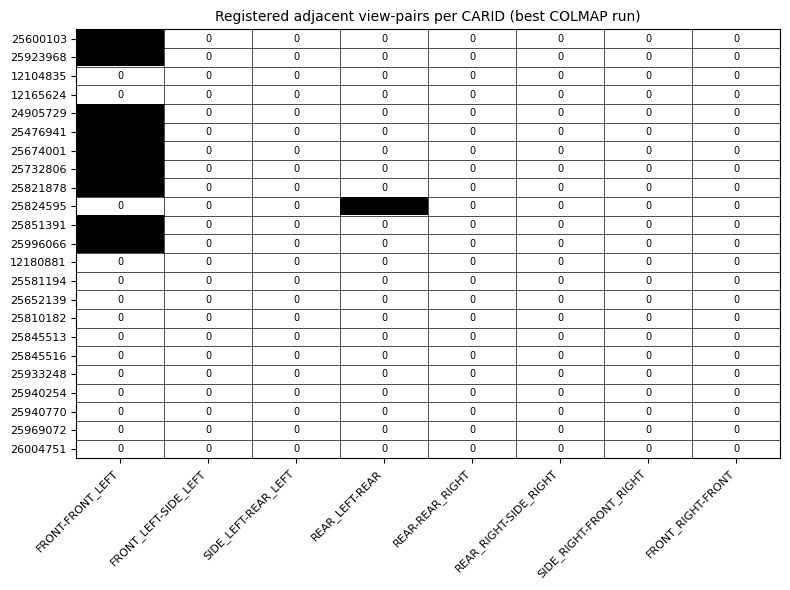

In [38]:
pair_heat = pair_matrix_df.set_index("CARID")[PAIR_COLUMNS]

fig, ax = plt.subplots(figsize=(8, 6))

cmap = ListedColormap(["white", "black"])
im = ax.imshow(pair_heat.values, aspect="auto", cmap=cmap, vmin=0, vmax=1)

ax.set_xticks(range(len(pair_heat.columns)))
ax.set_yticks(range(len(pair_heat.index)))

ax.set_xticklabels(pair_heat.columns, rotation=45, ha="right", fontsize=8)
ax.set_yticklabels(
    [f"{carid}" for carid in pair_heat.index],
    fontsize=8
)

# numbers inside cells
for i in range(pair_heat.shape[0]):
    for j in range(pair_heat.shape[1]):
        val = int(pair_heat.iloc[i, j])
        ax.text(j, i, val, ha="center", va="center", color="black", fontsize=7)

# grid
ax.set_xticks(np.arange(-.5, pair_heat.shape[1], 1), minor=True)
ax.set_yticks(np.arange(-.5, pair_heat.shape[0], 1), minor=True)
ax.grid(which="minor", color="black", linestyle="-", linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

ax.set_title("Registered adjacent view-pairs per CARID (best COLMAP run)", fontsize=10)

plt.tight_layout()
plt.show()

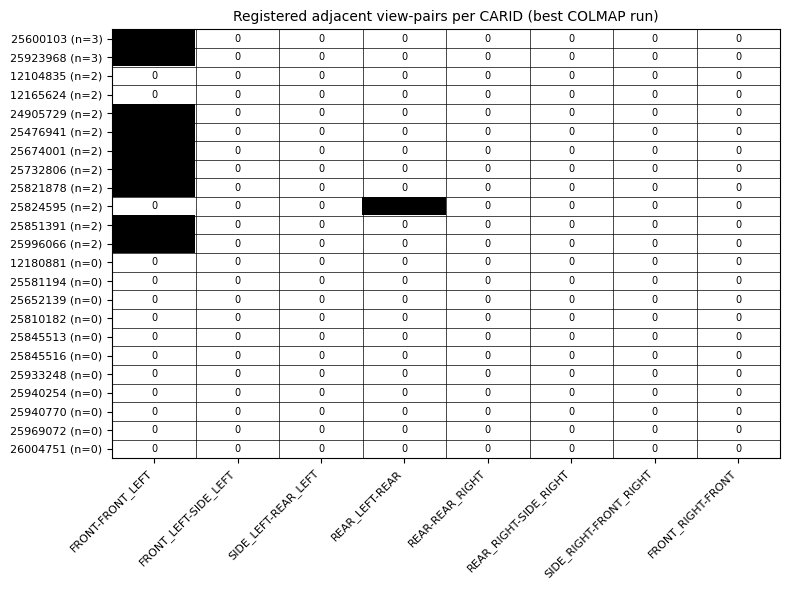

In [39]:
pair_heat = pair_matrix_df.set_index("CARID")[PAIR_COLUMNS]
y_labels = [
    f"{carid} (n={nreg})"
    for carid, nreg in zip(pair_matrix_df["CARID"], pair_matrix_df["n_registered_images"])
]

fig, ax = plt.subplots(figsize=(8, 6))

cmap = ListedColormap(["white", "black"])
ax.imshow(pair_heat.values, aspect="auto", cmap=cmap, vmin=0, vmax=1)

ax.set_xticks(range(len(pair_heat.columns)))
ax.set_yticks(range(len(pair_heat.index)))

ax.set_xticklabels(pair_heat.columns, rotation=45, ha="right", fontsize=8)
ax.set_yticklabels(y_labels, fontsize=8)

for i in range(pair_heat.shape[0]):
    for j in range(pair_heat.shape[1]):
        val = int(pair_heat.iloc[i, j])
        ax.text(j, i, val, ha="center", va="center", color="black", fontsize=7)

ax.set_xticks(np.arange(-.5, pair_heat.shape[1], 1), minor=True)
ax.set_yticks(np.arange(-.5, pair_heat.shape[0], 1), minor=True)
ax.grid(which="minor", color="black", linestyle="-", linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

ax.set_title("Registered adjacent view-pairs per CARID (best COLMAP run)", fontsize=10)

plt.tight_layout()
plt.show()

In [40]:
summary = (
    results_df.groupby("param_set")
    .agg(
        n_vehicles=("CARID", "nunique"),
        n_ok=("status", lambda s: int((s == "ok").sum())),
        n_feasible=("feasible", "sum"),
        mean_registration_rate=("registration_rate", "mean"),
        median_registration_rate=("registration_rate", "median"),
        mean_registered_images=("n_registered_images", "mean"),
        mean_registered_viewclasses=("registered_viewclasses", "mean"),
        mean_points3D=("n_points3D", "mean"),
    )
    .reset_index()
)
summary["failure_rate"] = 1 - (summary["n_feasible"] / summary["n_vehicles"])
display(summary.sort_values("mean_registration_rate", ascending=False))

,param_set,n_vehicles,n_ok,n_feasible,mean_registration_rate,median_registration_rate,mean_registered_images,mean_registered_viewclasses,mean_points3D,failure_rate
0,exhaustive_loose,23,9,0,0.104814,0.0,0.826087,0.826087,55.130435,1.0
2,pairs_loose,23,8,0,0.088509,0.0,0.695652,0.695652,22.086957,1.0
1,exhaustive_strict,23,5,0,0.066770,0.0,0.521739,0.521739,10.869565,1.0
3,pairs_strict,23,0,0,0.000000,0.0,0.000000,0.000000,0.000000,1.0


In [41]:
def plot_colmap_sparse_model(model_dir, title=None, max_points=5000):
    model_dir = Path(model_dir)
    images_bin = model_dir / "images.bin"
    points_bin = model_dir / "points3D.bin"
    if not images_bin.exists() or not points_bin.exists():
        print(f"Missing model files in: {model_dir}")
        return

    images = read_images_binary(images_bin)
    points3D = read_points3d_binary(points_bin)
    if len(images) == 0:
        print(f"No registered images in: {model_dir}")
        return

    cam_centers = np.array([camera_center_from_image(img) for img in images.values()])
    cam_names = [img["name"] for img in images.values()]
    pts = np.array([p["xyz"] for p in points3D.values()]) if len(points3D) > 0 else np.empty((0, 3))
    cols = np.array([p["rgb"] for p in points3D.values()]) / 255.0 if len(points3D) > 0 else np.empty((0, 3))

    if len(pts) > max_points:
        idx = np.random.choice(len(pts), size=max_points, replace=False)
        pts = pts[idx]
        cols = cols[idx]

    fig = plt.figure(figsize=(9, 7))
    ax = fig.add_subplot(111, projection="3d")
    if len(pts) > 0:
        ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2], c=cols, s=2, alpha=0.5)
    ax.scatter(cam_centers[:, 0], cam_centers[:, 1], cam_centers[:, 2], s=60, marker="^")

    for i, name in enumerate(cam_names):
        ax.text(cam_centers[i, 0], cam_centers[i, 1], cam_centers[i, 2], name, fontsize=8)

    all_xyz = cam_centers if len(pts) == 0 else np.vstack([pts, cam_centers])
    mins = all_xyz.min(axis=0)
    maxs = all_xyz.max(axis=0)
    center = (mins + maxs) / 2
    radius = np.max(maxs - mins) / 2 if np.max(maxs - mins) > 0 else 1.0
    ax.set_xlim(center[0] - radius, center[0] + radius)
    ax.set_ylim(center[1] - radius, center[1] + radius)
    ax.set_zlim(center[2] - radius, center[2] + radius)
    ax.set_title(title or str(model_dir))
    plt.tight_layout()
    plt.show()

In [42]:
ok_df = results_df[results_df["status"] == "ok"].copy()
display(ok_df[["CARID", "param_set", "registration_rate", "n_registered_images", "registered_viewclasses", "n_points3D"]].sort_values(["registration_rate", "n_points3D"], ascending=[False, False]).head(20))

,CARID,param_set,registration_rate,n_registered_images,registered_viewclasses,n_points3D
24,25600103,exhaustive_loose,0.375000,3,3,147
25,25600103,exhaustive_strict,0.375000,3,3,61
65,25923968,exhaustive_strict,0.375000,3,3,31
0,12104835,exhaustive_loose,0.285714,2,2,384
1,12104835,exhaustive_strict,0.285714,2,2,67
2,12104835,pairs_loose,0.285714,2,2,44
12,24905729,exhaustive_loose,0.250000,2,2,222
4,12165624,exhaustive_loose,0.250000,2,2,143
84,25996066,exhaustive_loose,0.250000,2,2,142
32,25674001,exhaustive_loose,0.250000,2,2,112


In [43]:
ok_df = results_df[results_df["status"] == "ok"].copy()
display(ok_df[["CARID", "param_set", "registration_rate", "n_registered_images", "registered_viewclasses", "n_points3D"]].sort_values(["registration_rate", "n_points3D"], ascending=[False, False]))

,CARID,param_set,registration_rate,n_registered_images,registered_viewclasses,n_points3D
24,25600103,exhaustive_loose,0.375000,3,3,147
25,25600103,exhaustive_strict,0.375000,3,3,61
65,25923968,exhaustive_strict,0.375000,3,3,31
0,12104835,exhaustive_loose,0.285714,2,2,384
1,12104835,exhaustive_strict,0.285714,2,2,67
2,12104835,pairs_loose,0.285714,2,2,44
12,24905729,exhaustive_loose,0.250000,2,2,222
4,12165624,exhaustive_loose,0.250000,2,2,143
84,25996066,exhaustive_loose,0.250000,2,2,142
32,25674001,exhaustive_loose,0.250000,2,2,112


In [44]:
plot_df = ok_df[[
    "CARID", "param_set", "registration_rate",
    "n_registered_images", "registered_viewclasses", "n_points3D", "run_dir"
]].copy()

display(plot_df.sort_values(["CARID", "param_set"]))

,CARID,param_set,registration_rate,n_registered_images,registered_viewclasses,n_points3D,run_dir
0,12104835,exhaustive_loose,0.285714,2,2,384,..\data\COLMAP_curated_runs\car_12104835\exhau...
1,12104835,exhaustive_strict,0.285714,2,2,67,..\data\COLMAP_curated_runs\car_12104835\exhau...
2,12104835,pairs_loose,0.285714,2,2,44,..\data\COLMAP_curated_runs\car_12104835\pairs...
4,12165624,exhaustive_loose,0.250000,2,2,143,..\data\COLMAP_curated_runs\car_12165624\exhau...
5,12165624,exhaustive_strict,0.250000,2,2,76,..\data\COLMAP_curated_runs\car_12165624\exhau...
6,12165624,pairs_loose,0.250000,2,2,30,..\data\COLMAP_curated_runs\car_12165624\pairs...
12,24905729,exhaustive_loose,0.250000,2,2,222,..\data\COLMAP_curated_runs\car_24905729\exhau...
18,25476941,pairs_loose,0.250000,2,2,59,..\data\COLMAP_curated_runs\car_25476941\pairs...
24,25600103,exhaustive_loose,0.375000,3,3,147,..\data\COLMAP_curated_runs\car_25600103\exhau...
25,25600103,exhaustive_strict,0.375000,3,3,61,..\data\COLMAP_curated_runs\car_25600103\exhau...


In [45]:
count_table = (
    plot_df
    .groupby(["param_set", "n_registered_images"])
    .size()
    .unstack(fill_value=0)
    .sort_index()
)

display(count_table)

n_registered_images,2,3
param_set,,
exhaustive_loose,8,1
exhaustive_strict,3,2
pairs_loose,8,0


In [46]:
analysis_df = merged.copy()

def reg_group(n):
    if pd.isna(n) or n == 0:
        return "failed"
    elif n <= 2:
        return "pair_only"
    elif n == 3:
        return "partial"
    else:
        return "meaningful"

analysis_df["reg_group"] = analysis_df["n_registered_images"].apply(reg_group)

# Binary success: partial or better
analysis_df["is_success"] = (
    (analysis_df["status"] == "ok") &
    (analysis_df["n_registered_images"] >= 3)
)

# CARID x param_set matrix with registered image counts
nreg_matrix = (
    analysis_df.pivot_table(
        index="CARID",
        columns="param_set",
        values="n_registered_images",
        aggfunc="max",
        fill_value=0,
    )
    .sort_index()
)

# CARID x param_set binary success matrix
success_matrix = (
    analysis_df.pivot_table(
        index="CARID",
        columns="param_set",
        values="is_success",
        aggfunc="max",
        fill_value=False,
    )
    .astype(int)
    .sort_index()
)

success_matrix["n_successful_methods"] = success_matrix.sum(axis=1)

display(nreg_matrix)
display(success_matrix)
print("Number of CARIDs in matrix:", len(success_matrix))

NameError: name 'merged' is not defined

In [47]:
import matplotlib.pyplot as plt
import numpy as np

mat = nreg_matrix.copy()

fig, ax = plt.subplots(figsize=(6, 6))  # smaller

im = ax.imshow(mat.values, cmap="Greys", vmin=0, vmax=3)

# ticks
ax.set_xticks(range(len(mat.columns)))
ax.set_yticks(range(len(mat.index)))

ax.set_xticklabels(mat.columns, rotation=90, ha="right", fontsize=8)
ax.set_yticklabels(mat.index, fontsize=8)

# add numbers inside cells
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        val = int(mat.iloc[i, j])
        ax.text(j, i, val, ha="center", va="center",
                color="black" if val < 2 else "white",
                fontsize=8)

# grid lines
ax.set_xticks(np.arange(-.5, mat.shape[1], 1), minor=True)
ax.set_yticks(np.arange(-.5, mat.shape[0], 1), minor=True)
ax.grid(which="minor", color="black", linestyle='-', linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

# title
ax.set_title("Registered images per CARID and setting", fontsize=10)

plt.tight_layout()
plt.show()

NameError: name 'nreg_matrix' is not defined

In [48]:
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import math
import numpy as np

def parse_colmap_images_txt(images_txt_path):
    """
    Parse COLMAP images.txt exported with model_converter --output_type TXT.
    Returns a list of dicts with image name, qvec, tvec, etc.
    """
    images = []
    images_txt_path = Path(images_txt_path)

    if not images_txt_path.exists():
        return images

    lines = images_txt_path.read_text(encoding="utf-8").splitlines()

    i = 0
    while i < len(lines):
        line = lines[i].strip()

        if not line or line.startswith("#"):
            i += 1
            continue

        parts = line.split()
        # image header line:
        # IMAGE_ID QW QX QY QZ TX TY TZ CAMERA_ID NAME
        if len(parts) >= 10 and parts[0].isdigit():
            images.append({
                "image_id": int(parts[0]),
                "qvec": np.array(list(map(float, parts[1:5]))),
                "tvec": np.array(list(map(float, parts[5:8]))),
                "camera_id": int(parts[8]),
                "name": parts[9],
            })
            i += 2  # skip the next line with 2D points
        else:
            i += 1

    return images

def parse_colmap_points3d_txt(points3d_txt_path, max_points=None):
    pts = []
    cols = []
    points3d_txt_path = Path(points3d_txt_path)

    if not points3d_txt_path.exists():
        return np.empty((0, 3)), np.empty((0, 3))

    for line in points3d_txt_path.read_text(encoding="utf-8").splitlines():
        line = line.strip()
        if not line or line.startswith("#"):
            continue
        parts = line.split()
        # POINT3D_ID X Y Z R G B ERROR TRACK[]
        if len(parts) >= 7:
            pts.append([float(parts[1]), float(parts[2]), float(parts[3])])
            cols.append([int(parts[4]), int(parts[5]), int(parts[6])])

    if len(pts) == 0:
        return np.empty((0, 3)), np.empty((0, 3))

    pts = np.array(pts, dtype=float)
    cols = np.array(cols, dtype=float) / 255.0

    if max_points is not None and len(pts) > max_points:
        idx = np.random.choice(len(pts), size=max_points, replace=False)
        pts = pts[idx]
        cols = cols[idx]

    return pts, cols

def qvec2rotmat(qvec):
    w, x, y, z = qvec
    return np.array([
        [1 - 2*y*y - 2*z*z, 2*x*y - 2*w*z,     2*x*z + 2*w*y],
        [2*x*y + 2*w*z,     1 - 2*x*x - 2*z*z, 2*y*z - 2*w*x],
        [2*x*z - 2*w*y,     2*y*z + 2*w*x,     1 - 2*x*x - 2*y*y]
    ])

def camera_center_from_qt(qvec, tvec):
    R = qvec2rotmat(qvec)
    t = tvec.reshape(3, 1)
    C = -R.T @ t
    return C.ravel()

In [49]:
def plot_sparse_model_from_txt(run_dir, title=None, max_points=5000):
    run_dir = Path(run_dir)
    txt_dir = run_dir / "sparse_txt"
    images_txt = txt_dir / "images.txt"
    points3d_txt = txt_dir / "points3D.txt"

    images = parse_colmap_images_txt(images_txt)
    pts, cols = parse_colmap_points3d_txt(points3d_txt, max_points=max_points)

    if len(images) == 0:
        print(f"No registered images found in {images_txt}")
        return

    cam_centers = np.array([camera_center_from_qt(img["qvec"], img["tvec"]) for img in images])
    cam_names = [img["name"] for img in images]

    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection="3d")

    if len(pts) > 0:
        ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2], c=cols, s=3, alpha=0.5)

    ax.scatter(cam_centers[:, 0], cam_centers[:, 1], cam_centers[:, 2], s=80, marker="^")

    for i, name in enumerate(cam_names):
        ax.text(cam_centers[i, 0], cam_centers[i, 1], cam_centers[i, 2], name, fontsize=9)

    all_xyz = cam_centers if len(pts) == 0 else np.vstack([pts, cam_centers])
    mins = all_xyz.min(axis=0)
    maxs = all_xyz.max(axis=0)
    center = (mins + maxs) / 2
    radius = max(np.max(maxs - mins) / 2, 1e-6)

    ax.set_xlim(center[0] - radius, center[0] + radius)
    ax.set_ylim(center[1] - radius, center[1] + radius)
    ax.set_zlim(center[2] - radius, center[2] + radius)

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title(title if title is not None else run_dir.name)

    plt.tight_layout()
    plt.show()

In [50]:
def show_registered_images(run_dir, ncols=4, figsize=(14, 8)):
    run_dir = Path(run_dir)
    car_dir = run_dir.parent
    carid = car_dir.name.replace("car_", "")
    images_dir = CARS_DIR / f"car_{carid}" / "images"

    txt_dir = run_dir / "sparse_txt"
    images_txt = txt_dir / "images.txt"
    images = parse_colmap_images_txt(images_txt)

    if len(images) == 0:
        print(f"No registered images found for {run_dir}")
        return

    registered_names = [img["name"] for img in images]
    image_paths = [images_dir / name for name in registered_names]

    n = len(image_paths)
    ncols = min(ncols, n)
    nrows = math.ceil(n / ncols)

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.array(axes).reshape(-1)

    for ax, img_path, name in zip(axes, image_paths, registered_names):
        if img_path.exists():
            im = Image.open(img_path)
            ax.imshow(im)
            ax.set_title(name)
        else:
            ax.text(0.5, 0.5, f"Missing\\n{name}", ha="center", va="center")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

CARID=12104835 | exhaustive_loose | reg=2 | views=2 | pts=384


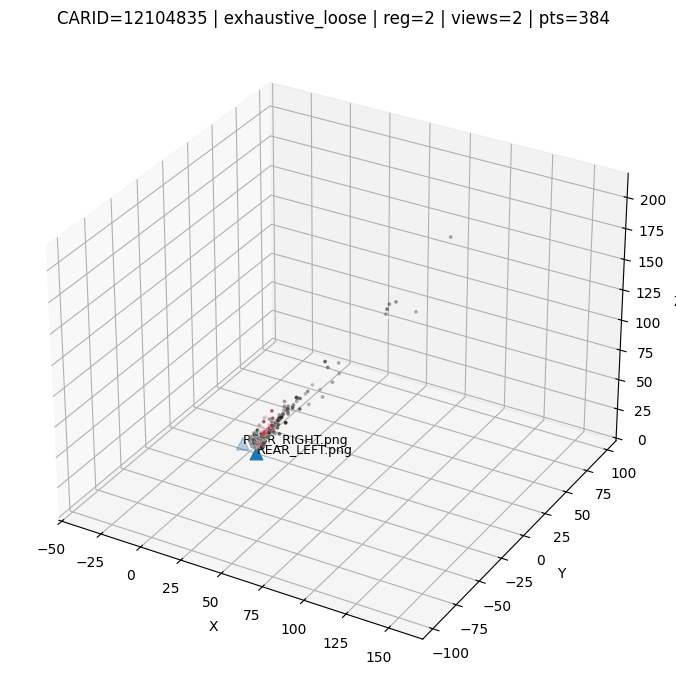

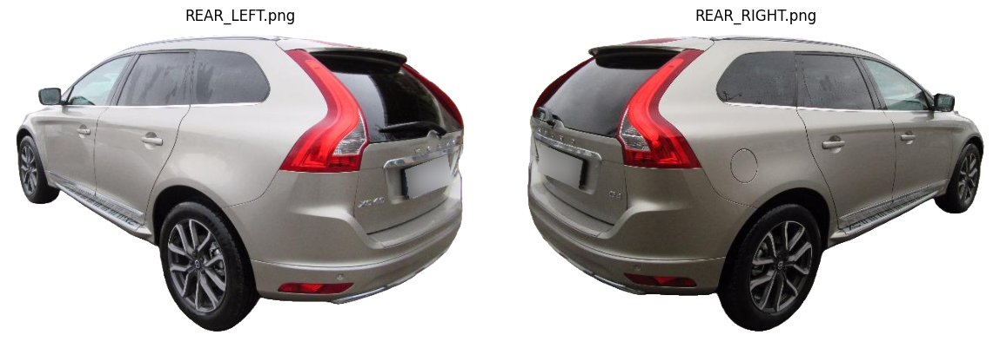

CARID=12104835 | exhaustive_strict | reg=2 | views=2 | pts=67


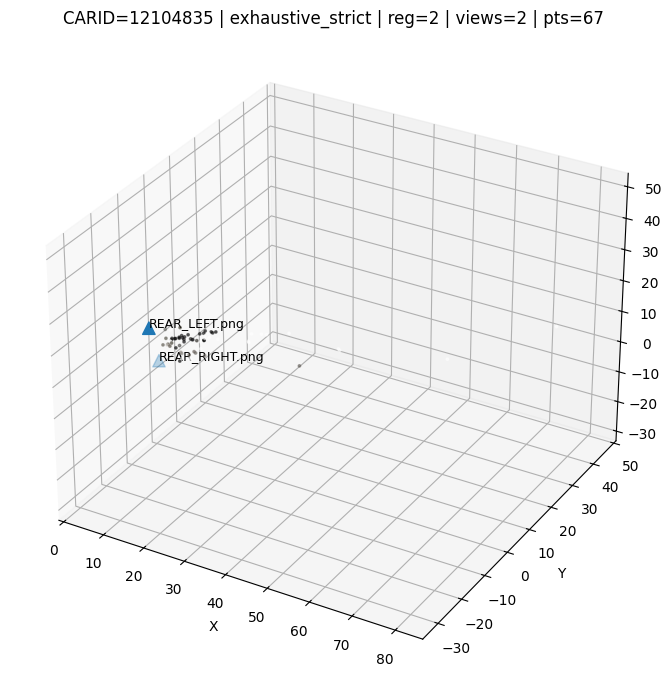

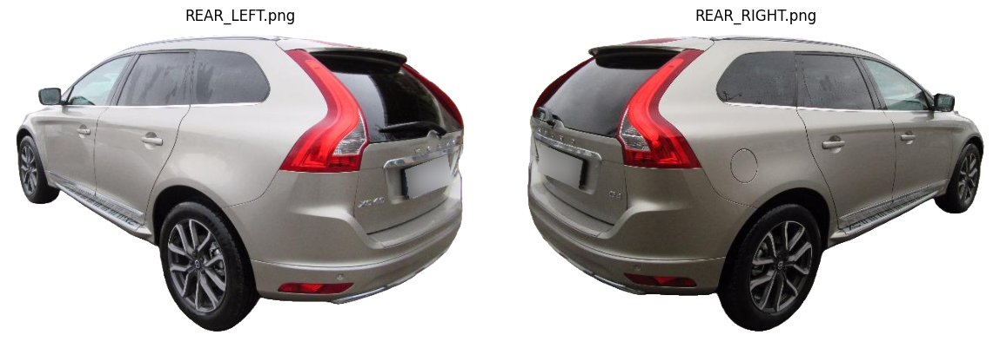

CARID=12104835 | pairs_loose | reg=2 | views=2 | pts=44


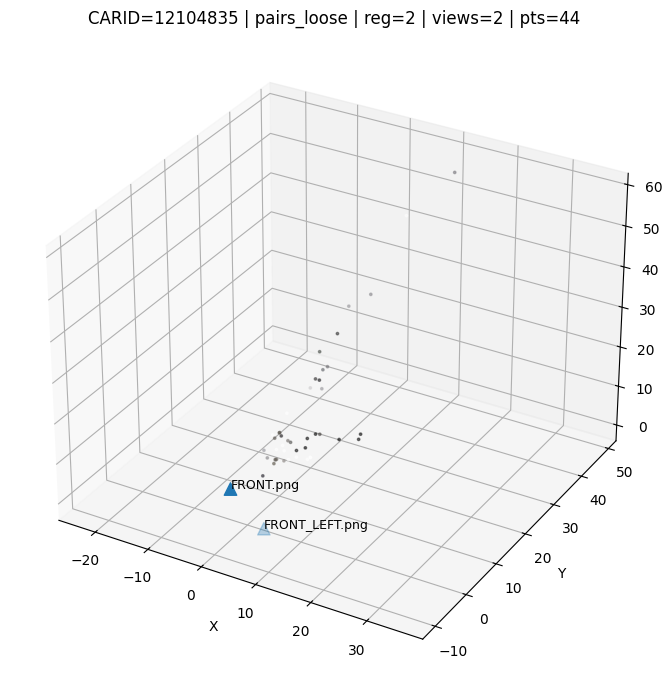

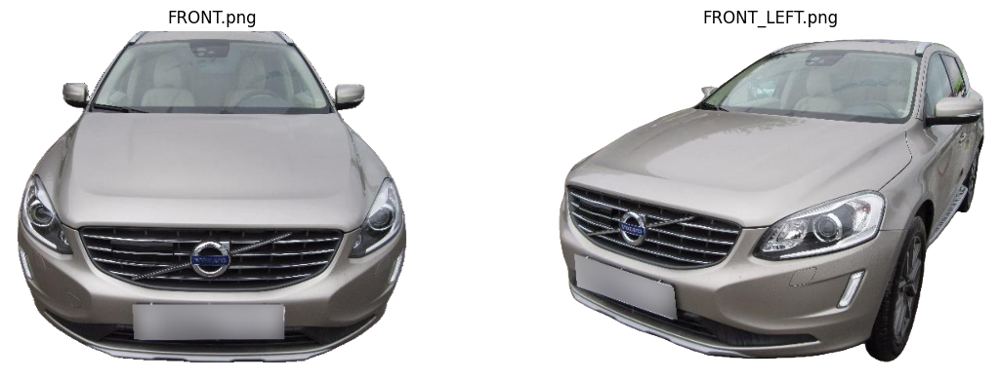

CARID=12165624 | exhaustive_loose | reg=2 | views=2 | pts=143


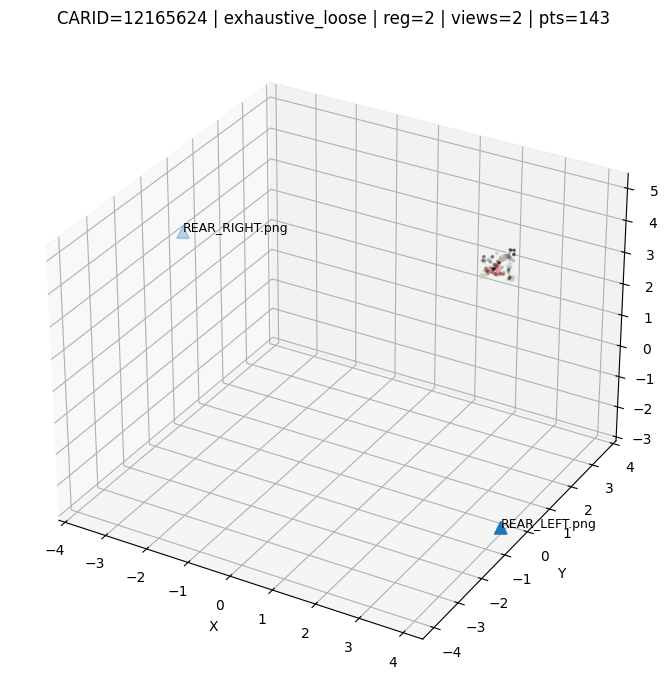

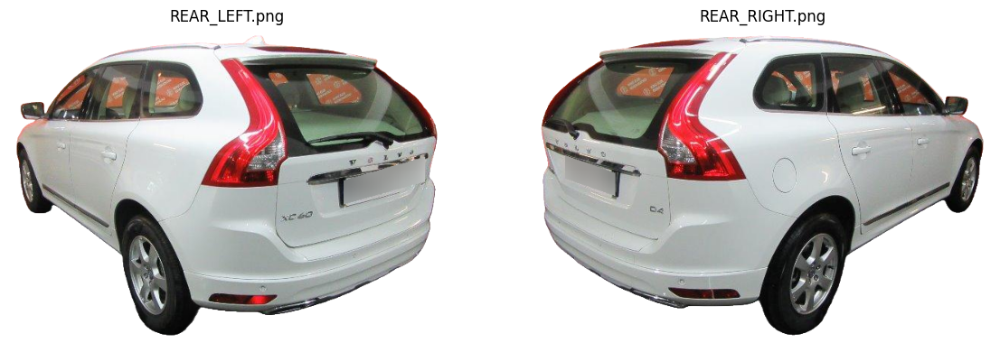

CARID=12165624 | exhaustive_strict | reg=2 | views=2 | pts=76


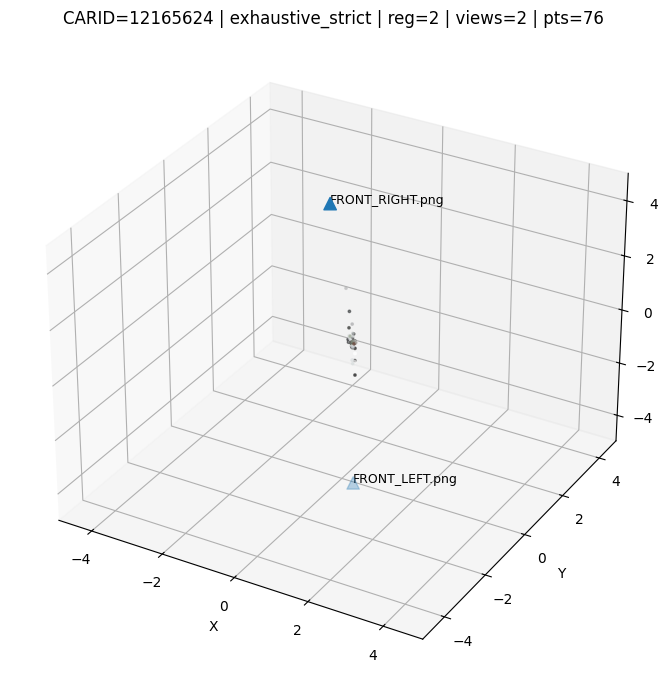

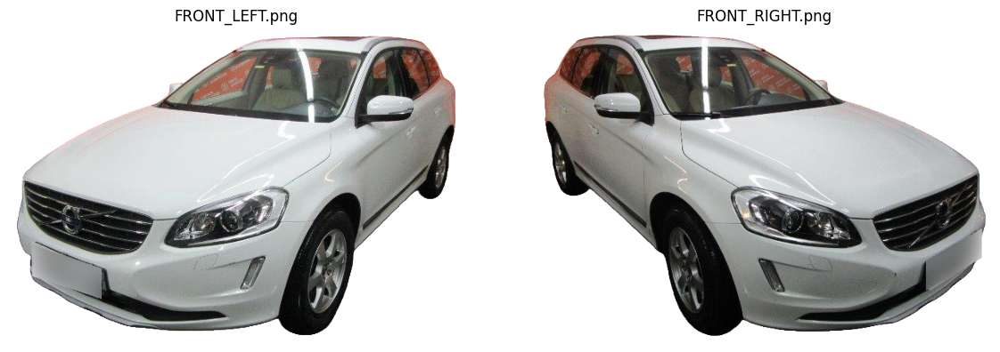

CARID=12165624 | pairs_loose | reg=2 | views=2 | pts=30


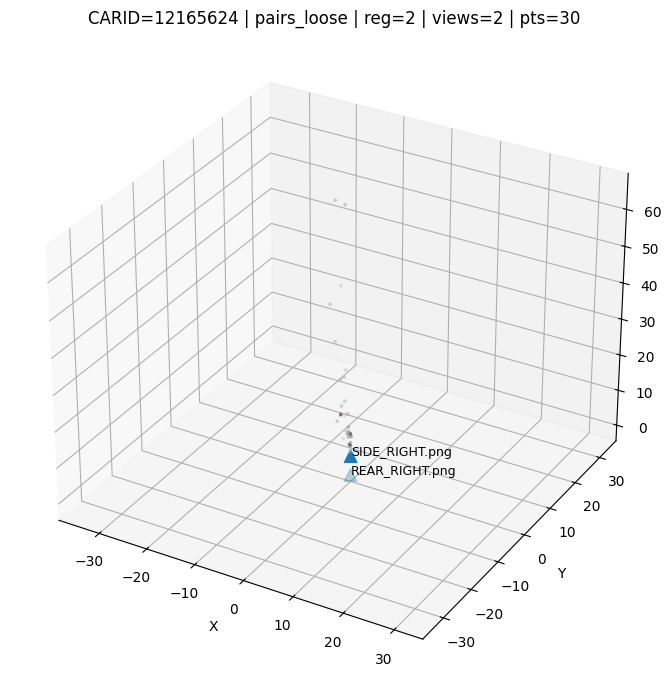

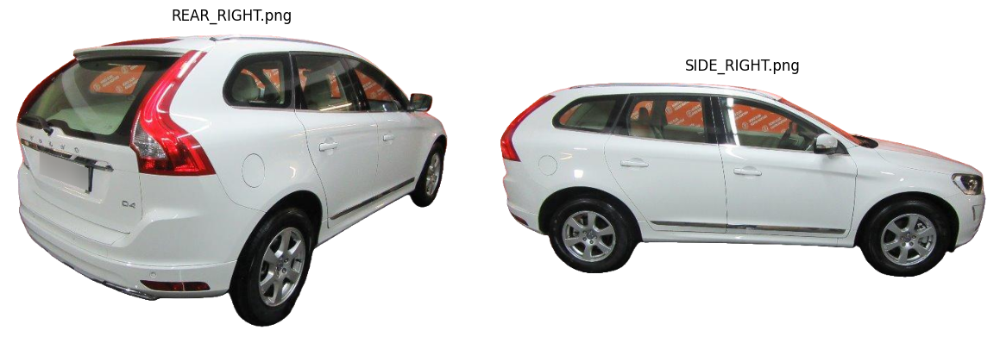

CARID=24905729 | exhaustive_loose | reg=2 | views=2 | pts=222


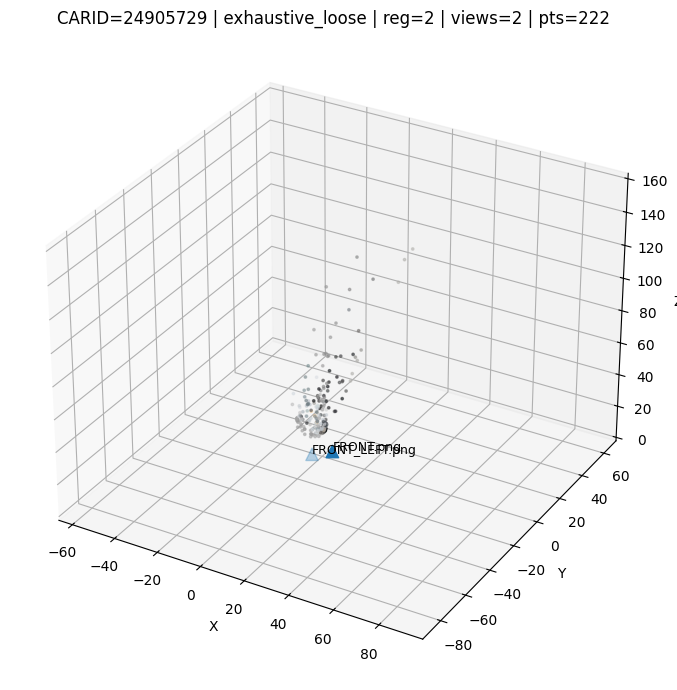

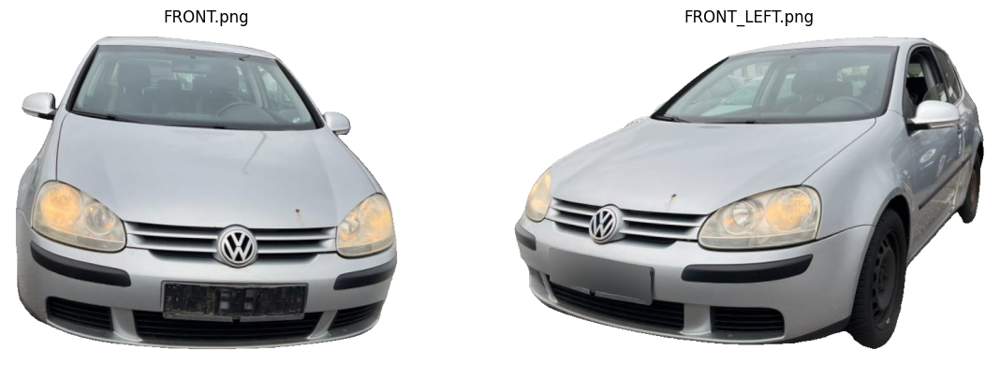

CARID=25476941 | pairs_loose | reg=2 | views=2 | pts=59


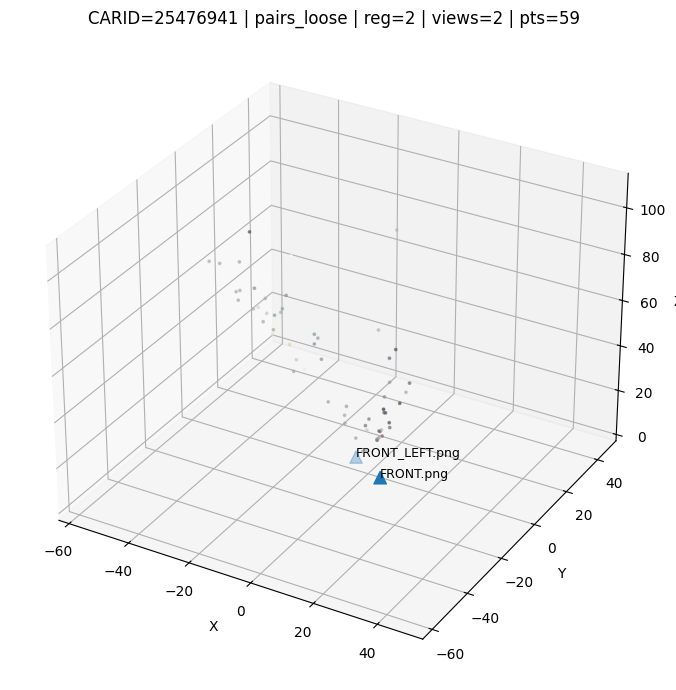

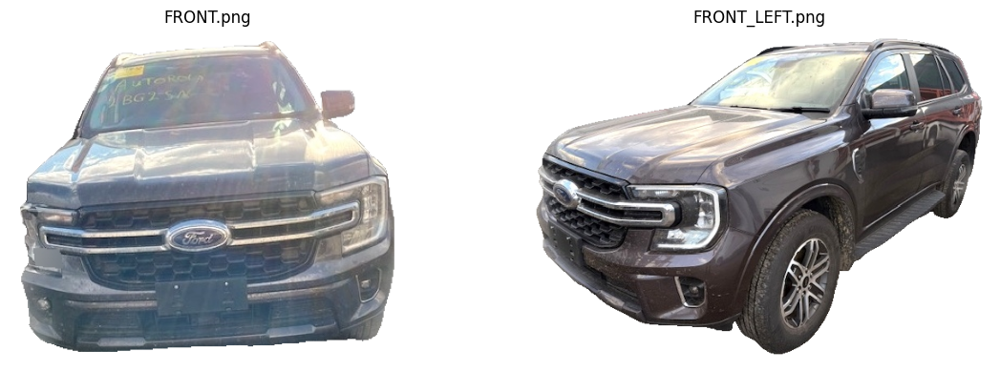

CARID=25600103 | exhaustive_loose | reg=3 | views=3 | pts=147


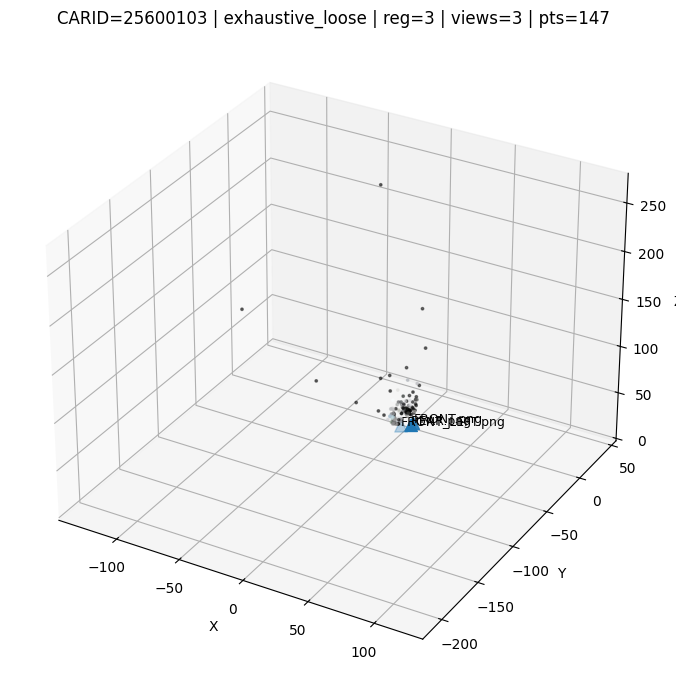

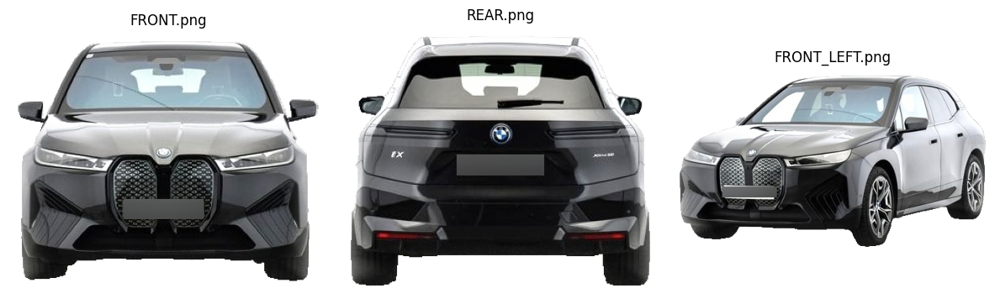

CARID=25600103 | exhaustive_strict | reg=3 | views=3 | pts=61


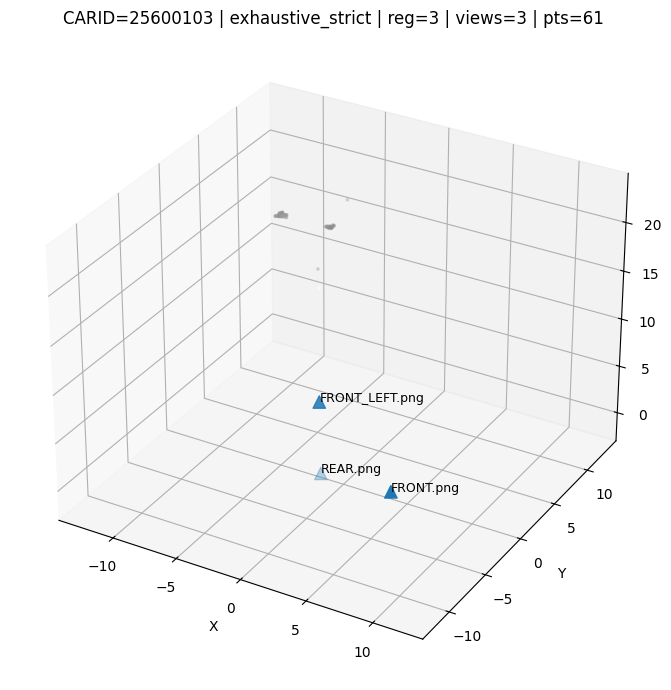

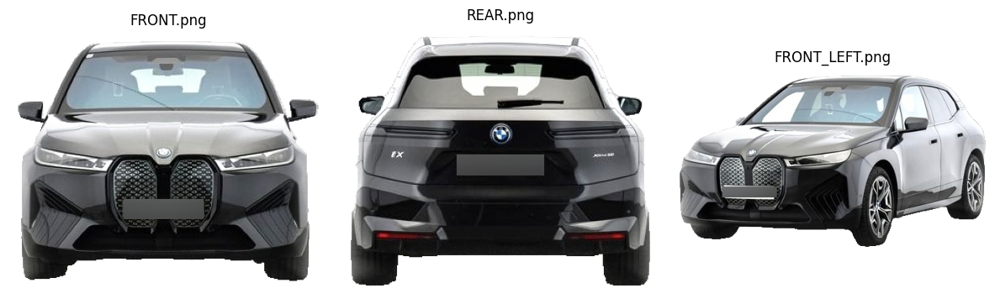

CARID=25600103 | pairs_loose | reg=2 | views=2 | pts=45


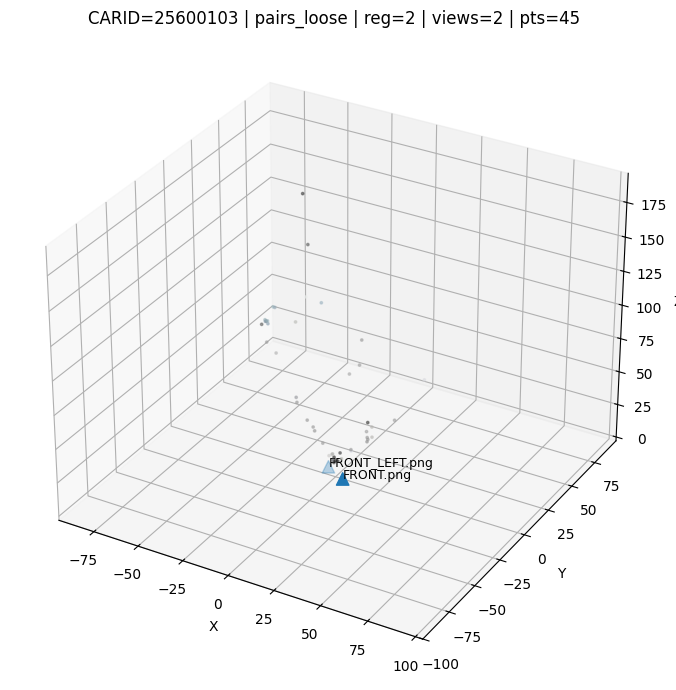

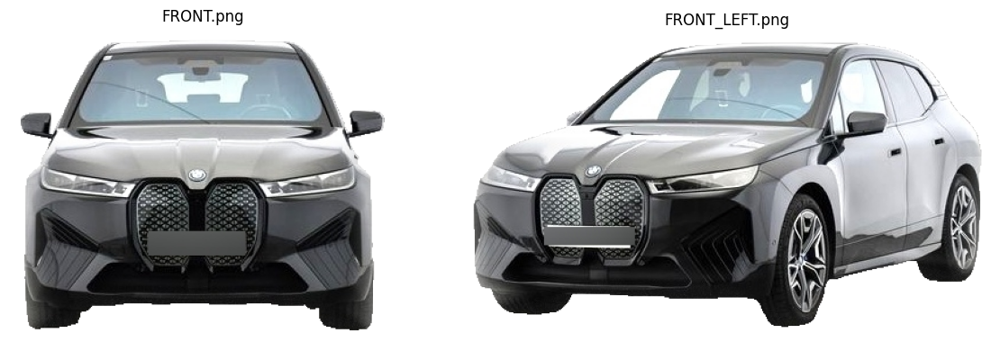

CARID=25674001 | exhaustive_loose | reg=2 | views=2 | pts=112


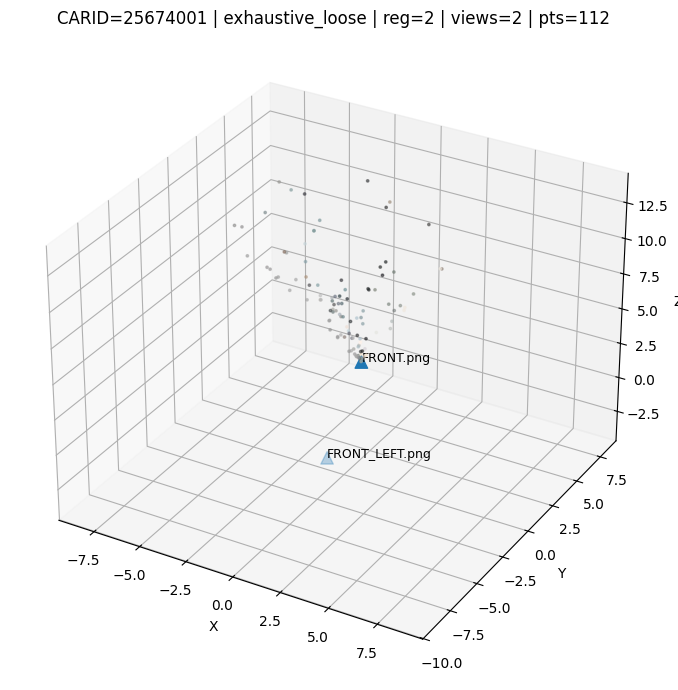

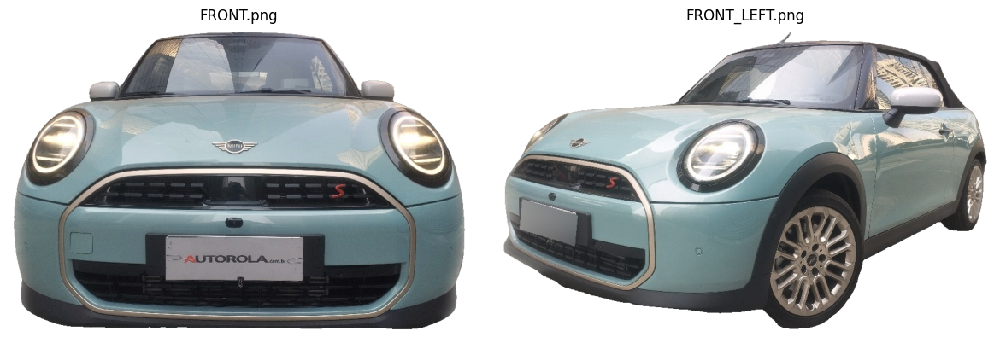

CARID=25732806 | pairs_loose | reg=2 | views=2 | pts=105


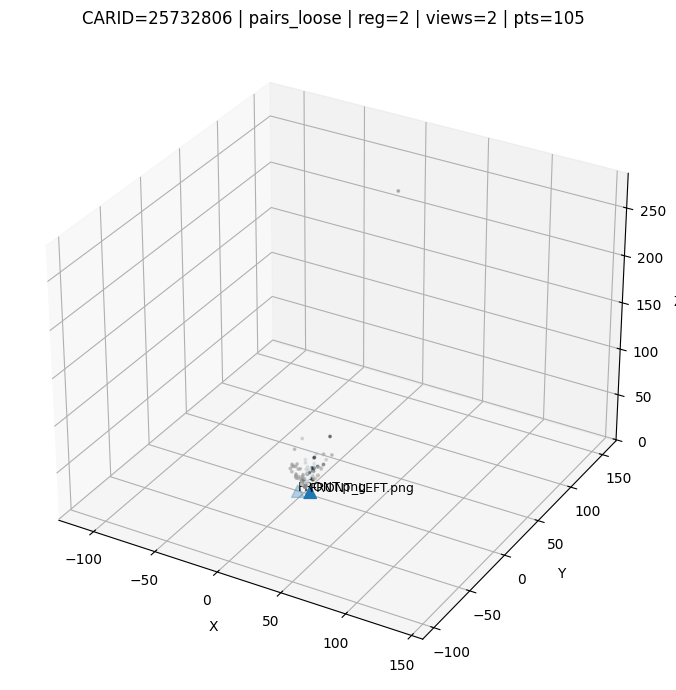

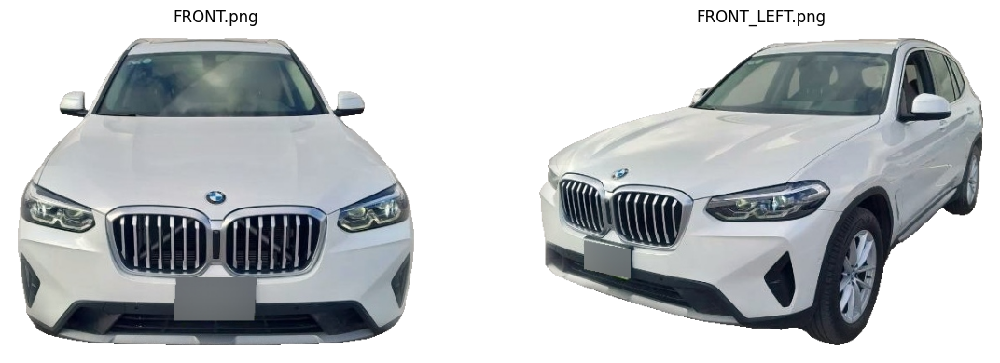

CARID=25821878 | exhaustive_loose | reg=2 | views=2 | pts=41


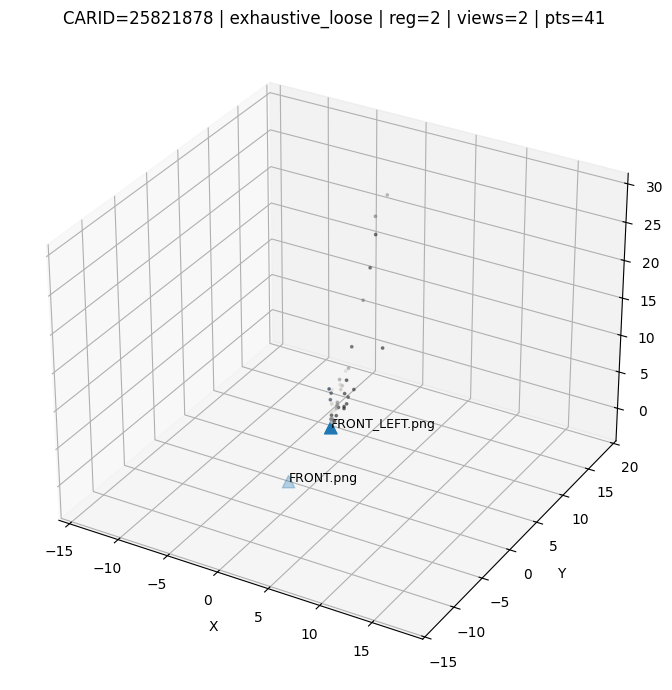

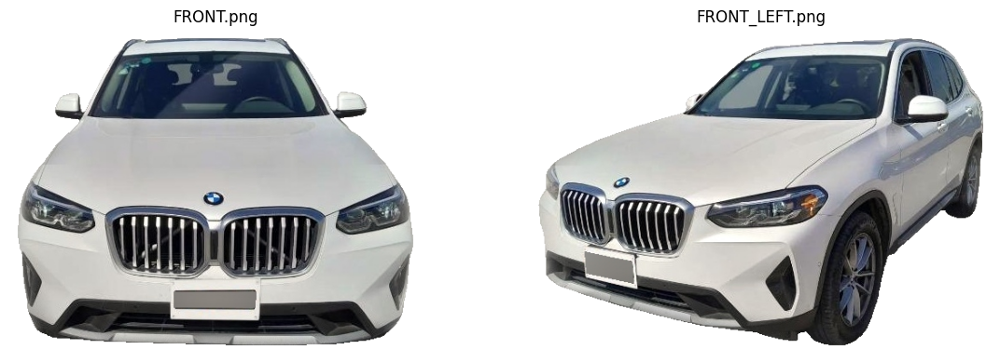

CARID=25824595 | exhaustive_loose | reg=2 | views=2 | pts=41


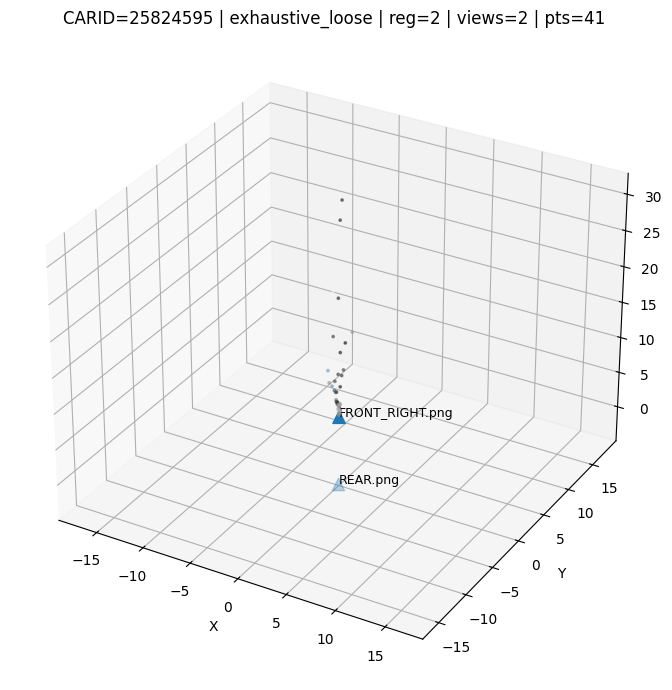

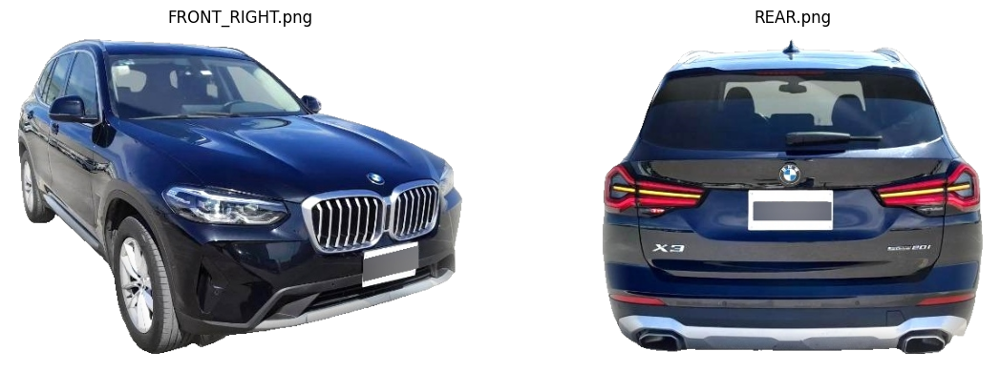

CARID=25824595 | exhaustive_strict | reg=2 | views=2 | pts=15


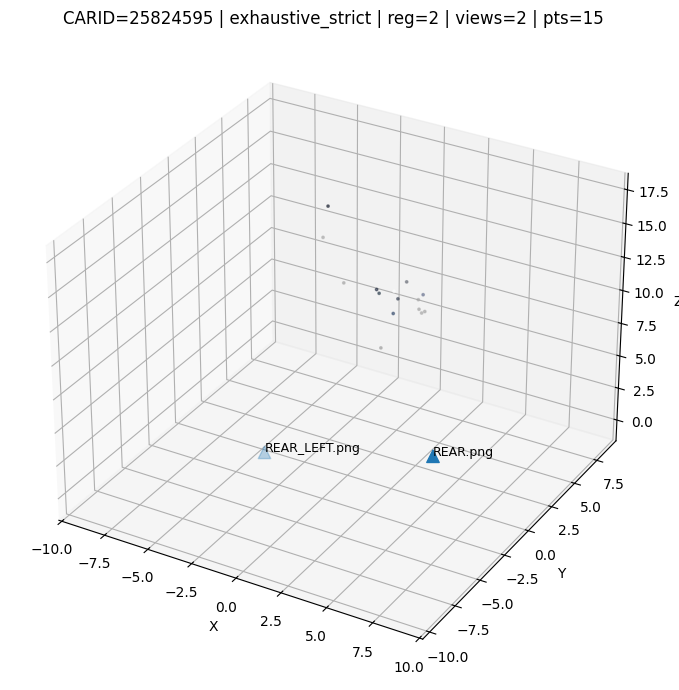

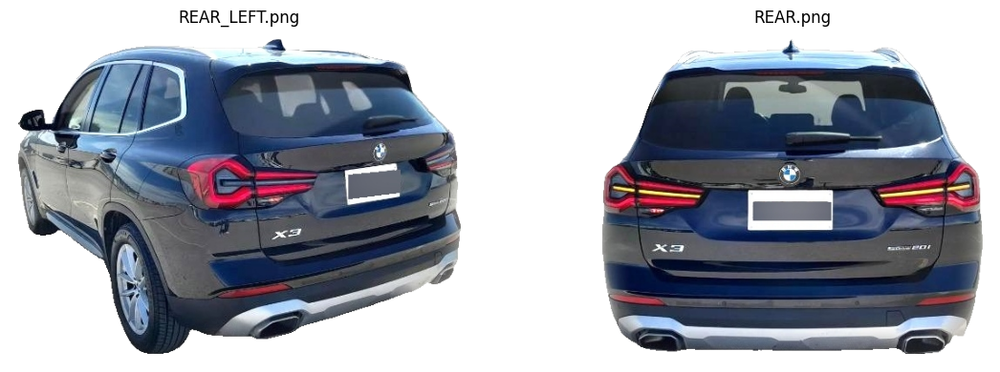

CARID=25824595 | pairs_loose | reg=2 | views=2 | pts=42


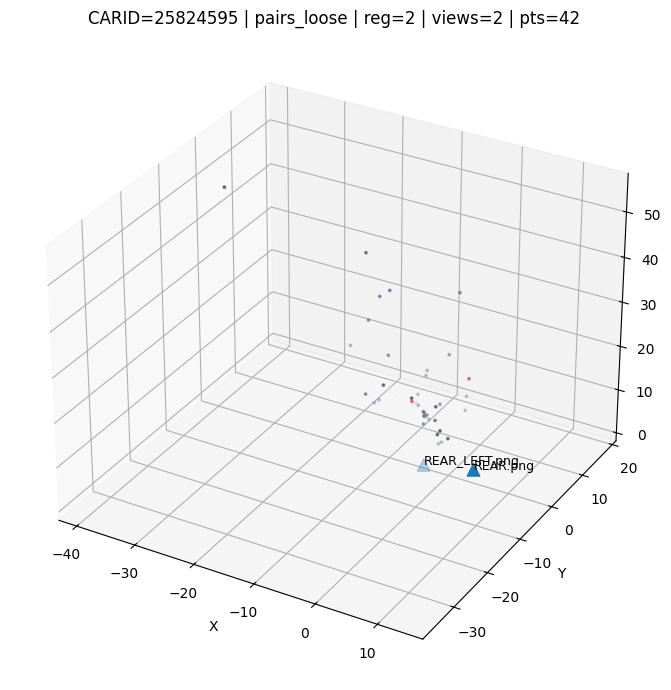

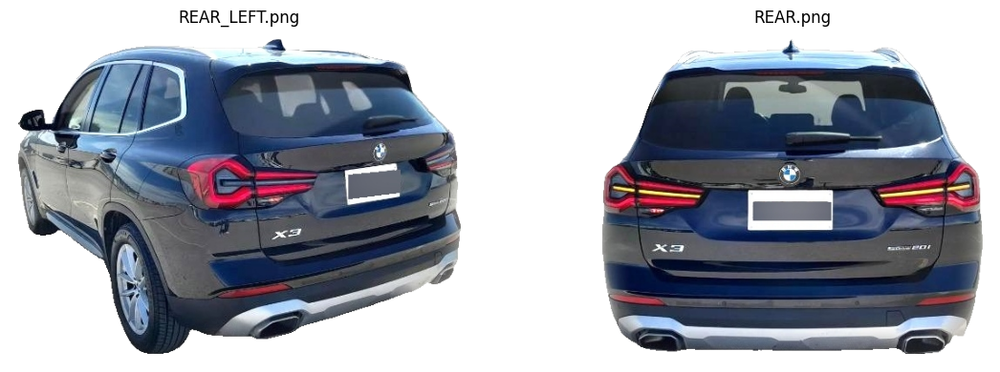

CARID=25851391 | exhaustive_loose | reg=2 | views=2 | pts=36


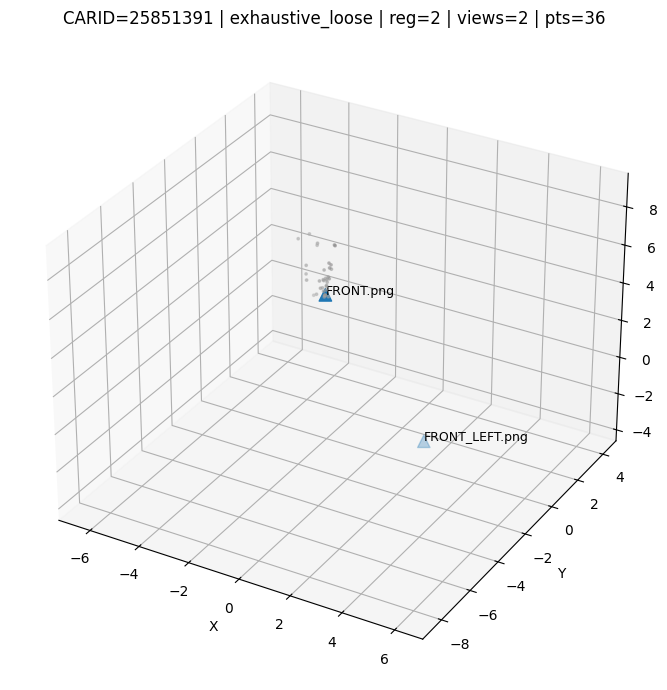

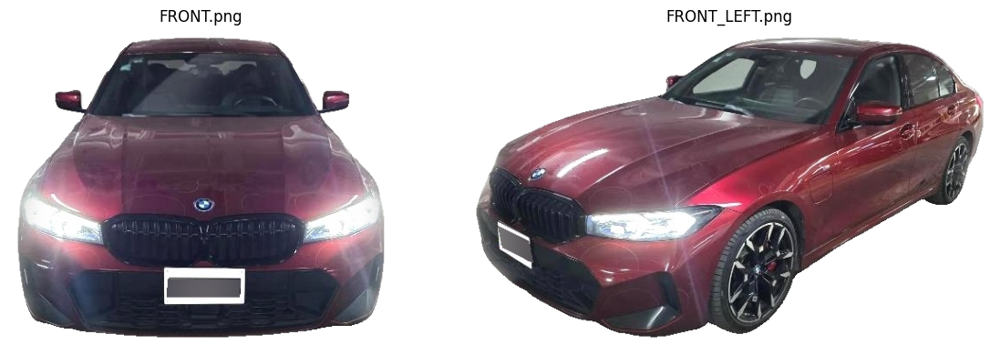

CARID=25923968 | exhaustive_strict | reg=3 | views=3 | pts=31


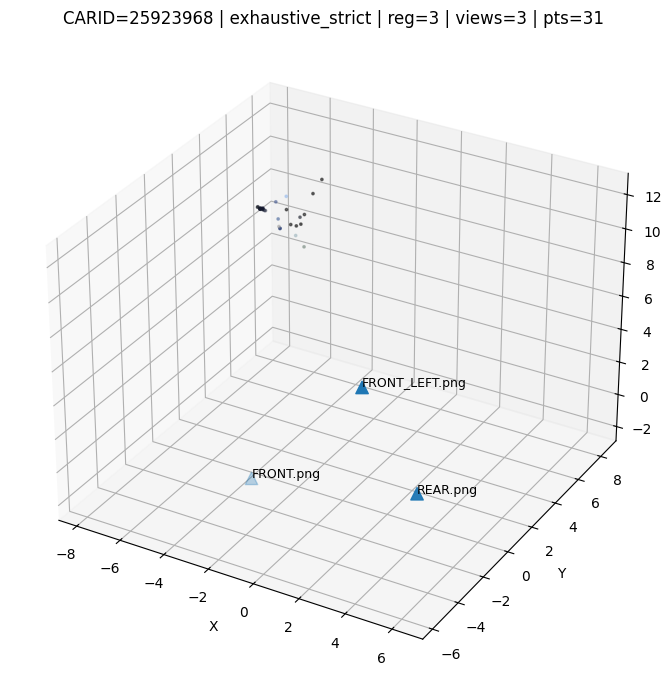

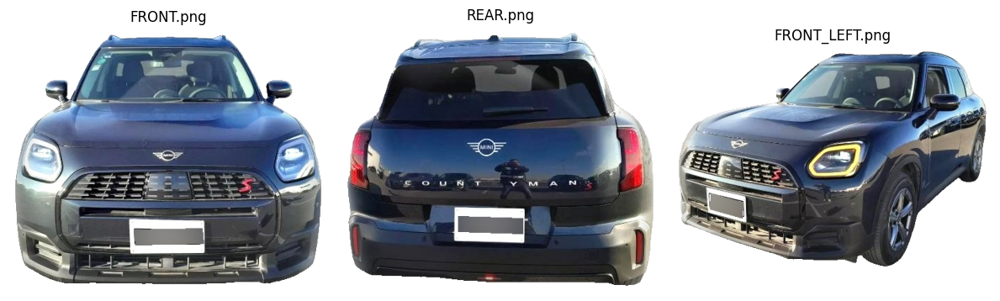

CARID=25923968 | pairs_loose | reg=2 | views=2 | pts=106


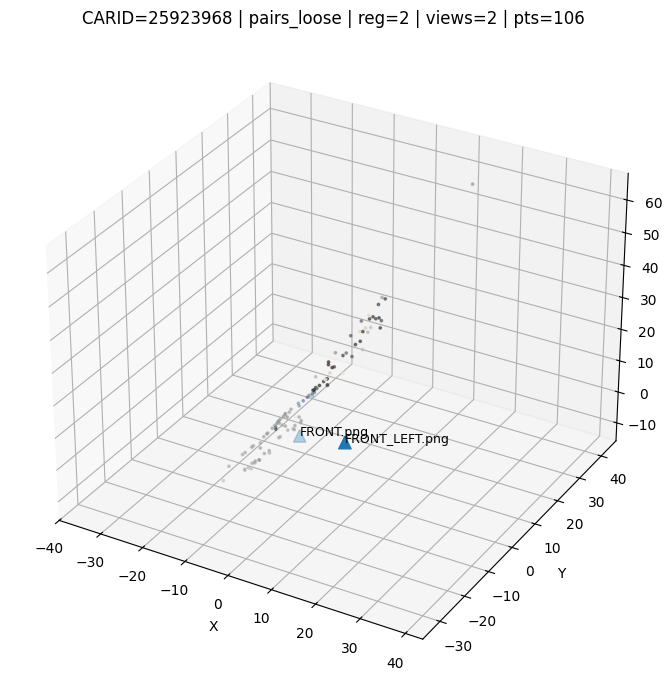

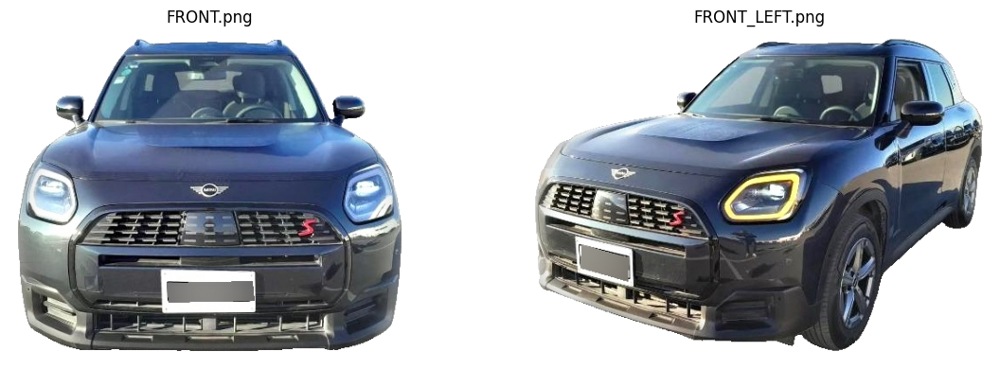

CARID=25996066 | exhaustive_loose | reg=2 | views=2 | pts=142


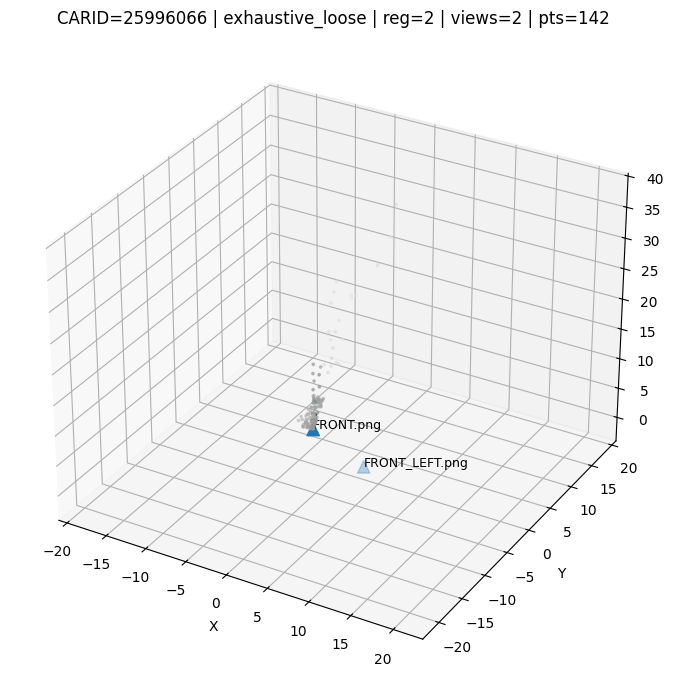

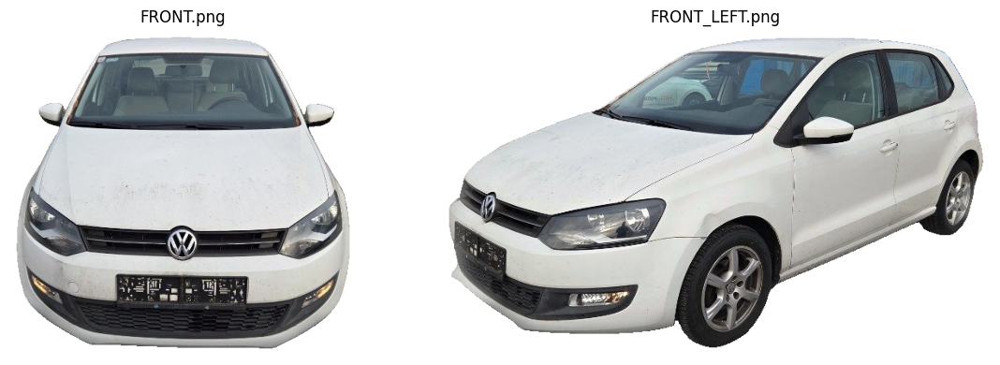

CARID=25996066 | pairs_loose | reg=2 | views=2 | pts=77


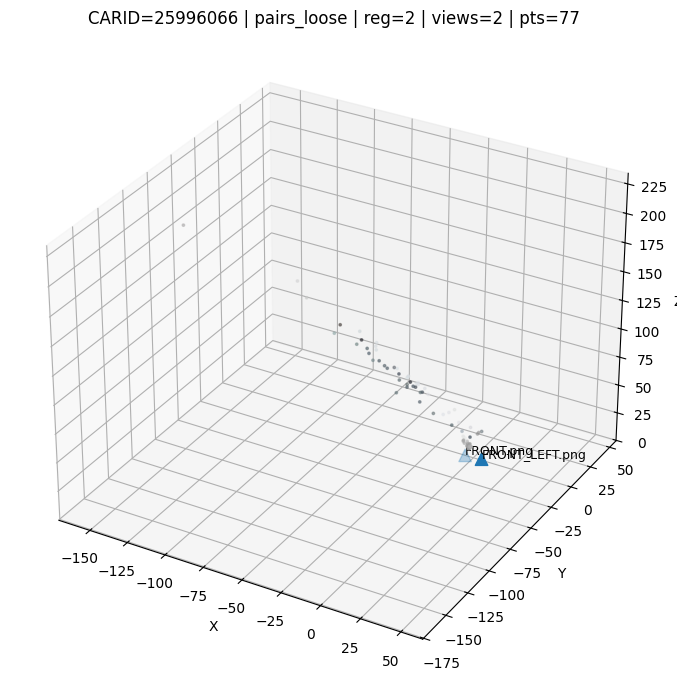

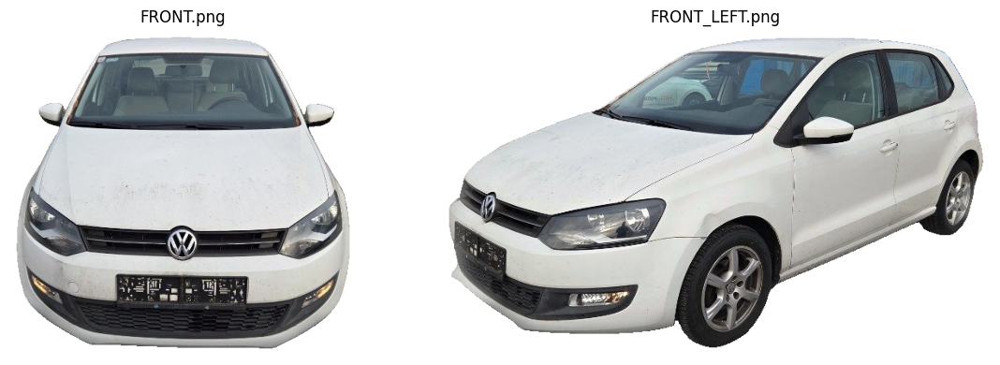

In [51]:
for _, row in plot_df.sort_values(["CARID", "param_set"]).iterrows():
    title = (
        f'CARID={row["CARID"]} | {row["param_set"]} | '
        f'reg={row["n_registered_images"]} | '
        f'views={row["registered_viewclasses"]} | '
        f'pts={row["n_points3D"]}'
    )

    print("=" * 100)
    print(title)

    plot_sparse_model_from_txt(row["run_dir"], title=title, max_points=5000)
    show_registered_images(row["run_dir"], ncols=4, figsize=(12, 4))

In [63]:
import numpy as np
import pandas as pd

# one row per CARID from curated_df
scene_meta = (
    curated_df.groupby("CARID")
    .agg(
        n_images_curated=("PICTUREID", "count"),
        n_viewclasses_curated=("VIEWCLASS", "nunique"),

        width_mean=("WIDTH_IMG", "mean"),
        width_std=("WIDTH_IMG", "std"),
        height_mean=("HEIGHT_IMG", "mean"),
        height_std=("HEIGHT_IMG", "std"),

        aspect_ratio_mean=("ASPECT_RATIO", "mean"),
        aspect_ratio_std=("ASPECT_RATIO", "std"),

        brightness_mean=("BRIGHTNESS_MEAN", "mean"),
        brightness_std_between_imgs=("BRIGHTNESS_MEAN", "std"),

        contrast_mean=("BRIGHTNESS_STD", "mean"),
        contrast_std_between_imgs=("BRIGHTNESS_STD", "std"),

        sharpness_mean=("SHARPNESS", "mean"),
        sharpness_std=("SHARPNESS", "std"),

        r_mean=("R_MEAN", "mean"),
        g_mean=("G_MEAN", "mean"),
        b_mean=("B_MEAN", "mean"),

        colorfulness_mean=("COLORFULNESS", "mean"),
        colorfulness_std=("COLORFULNESS", "std"),

        highlight_ratio_mean=("HIGHLIGHT_RATIO", "mean"),
        highlight_ratio_std=("HIGHLIGHT_RATIO", "std"),

        shininess_mean=("SHININESS_SCORE", "mean"),
        shininess_std=("SHININESS_SCORE", "std"),
    )
    .reset_index()
)

scene_meta["resolution_cv"] = (
    (scene_meta["width_std"] / scene_meta["width_mean"]).fillna(0) +
    (scene_meta["height_std"] / scene_meta["height_mean"]).fillna(0)
) / 2

scene_color = (
    curated_df.groupby("CARID")["DOMINANT_COLOR"]
    .agg(lambda x: x.mode().iat[0] if not x.mode().empty else np.nan)
    .rename("dominant_color")
    .reset_index()
)

scene_meta = scene_meta.merge(scene_color, on="CARID", how="left")

display(scene_meta)

,CARID,n_images_curated,n_viewclasses_curated,width_mean,width_std,height_mean,height_std,aspect_ratio_mean,aspect_ratio_std,brightness_mean,...,g_mean,b_mean,colorfulness_mean,colorfulness_std,highlight_ratio_mean,highlight_ratio_std,shininess_mean,shininess_std,resolution_cv,dominant_color
0,12104835,7,7,592.428571,77.528182,395.142857,43.448930,1.532929,0.387809,153.823297,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray
1,12165624,8,8,615.750000,70.313075,398.750000,66.949341,1.612479,0.488324,172.890621,...,172.991898,171.670338,20.346506,9.922894,0.406951,0.078193,0.318026,0.042755,0.141044,white
2,12180881,8,8,641.125000,60.527296,447.375000,72.649722,1.480613,0.372307,151.411734,...,150.658300,152.279060,20.503048,9.848021,0.366358,0.053018,0.305680,0.031079,0.128400,gray
3,24905729,8,8,736.875000,80.447743,482.375000,95.634628,1.614023,0.528933,136.192478,...,136.305500,137.174482,21.984448,11.685477,0.114435,0.052557,0.146432,0.031079,0.153716,gray
4,25476941,8,8,510.750000,80.848624,358.125000,69.392131,1.488113,0.460439,123.117745,...,122.239446,125.202352,17.993524,4.970080,0.061384,0.030536,0.118575,0.016358,0.176030,gray
5,25581194,8,8,1083.375000,119.289489,602.750000,129.011351,1.899975,0.579127,110.031563,...,109.426555,109.668594,12.890945,7.260949,0.048359,0.012913,0.120616,0.005541,0.162074,gray
6,25600103,8,8,503.000000,144.221060,267.875000,3.090885,1.880770,0.553832,118.534925,...,118.568168,119.486332,7.679646,1.767896,0.082664,0.042480,0.140831,0.019336,0.149130,gray
7,25652139,8,8,1217.125000,142.980955,764.125000,109.554210,1.637637,0.410383,132.422264,...,132.460489,134.470285,12.962308,4.191768,0.162506,0.022616,0.177274,0.015280,0.130423,gray
8,25674001,8,8,871.250000,40.885729,546.875000,83.731608,1.636761,0.331165,130.799335,...,132.606544,132.137096,18.712272,3.041278,0.071315,0.023687,0.118525,0.010205,0.100018,gray
9,25732806,8,8,594.375000,135.392485,368.250000,28.424084,1.648537,0.528812,140.011032,...,140.600250,143.070993,17.021551,5.940331,0.093455,0.049039,0.135840,0.031263,0.152488,gray


In [53]:
merged = results_df.merge(scene_meta, on="CARID", how="left")

print("results_df shape:", results_df.shape)
print("merged shape:", merged.shape)
display(merged.head())

results_df shape: (92, 21)
merged shape: (92, 46)


,CARID,param_set,scene_dir,run_dir,status,feature_returncode,matcher_returncode,mapper_returncode,exception,db_images,...,g_mean,b_mean,colorfulness_mean,colorfulness_std,highlight_ratio_mean,highlight_ratio_std,shininess_mean,shininess_std,resolution_cv,dominant_color
0,12104835,exhaustive_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,NaN,7,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray
1,12104835,exhaustive_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,NaN,7,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray
2,12104835,pairs_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\pairs...,ok,0,0,0.0,NaN,7,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray
3,12104835,pairs_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\pairs...,mapper_failed,0,0,1.0,peline.cc:311] Finding good initial image pair...,7,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray
4,12165624,exhaustive_loose,..\data\COLMAP_curated\cars\car_12165624\images,..\data\COLMAP_curated_runs\car_12165624\exhau...,ok,0,0,0.0,NaN,8,...,172.991898,171.670338,20.346506,9.922894,0.406951,0.078193,0.318026,0.042755,0.141044,white


In [54]:
from pathlib import Path
import math
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image


def parse_colmap_images_txt(images_txt_path):
    """
    Parse COLMAP sparse_txt/images.txt exported with model_converter --output_type TXT.
    Returns a list of dicts with image name, qvec, tvec, camera_id.
    """
    images = []
    images_txt_path = Path(images_txt_path)

    if not images_txt_path.exists():
        return images

    lines = images_txt_path.read_text(encoding="utf-8").splitlines()

    i = 0
    while i < len(lines):
        line = lines[i].strip()

        if not line or line.startswith("#"):
            i += 1
            continue

        parts = line.split()

        # IMAGE_ID QW QX QY QZ TX TY TZ CAMERA_ID NAME
        if len(parts) >= 10 and parts[0].isdigit():
            images.append({
                "image_id": int(parts[0]),
                "qvec": np.array(list(map(float, parts[1:5]))),
                "tvec": np.array(list(map(float, parts[5:8]))),
                "camera_id": int(parts[8]),
                "name": parts[9],
            })
            i += 2  # skip next line (2D points)
        else:
            i += 1

    return images


def parse_colmap_points3d_txt(points3d_txt_path, max_points=None, random_state=0):
    """
    Parse COLMAP sparse_txt/points3D.txt.
    Returns:
        pts: (N,3)
        cols: (N,3) in [0,1]
    """
    pts = []
    cols = []
    points3d_txt_path = Path(points3d_txt_path)

    if not points3d_txt_path.exists():
        return np.empty((0, 3)), np.empty((0, 3))

    for line in points3d_txt_path.read_text(encoding="utf-8").splitlines():
        line = line.strip()
        if not line or line.startswith("#"):
            continue

        parts = line.split()
        # POINT3D_ID X Y Z R G B ERROR TRACK[]
        if len(parts) >= 7:
            pts.append([float(parts[1]), float(parts[2]), float(parts[3])])
            cols.append([int(parts[4]), int(parts[5]), int(parts[6])])

    if len(pts) == 0:
        return np.empty((0, 3)), np.empty((0, 3))

    pts = np.array(pts, dtype=float)
    cols = np.array(cols, dtype=float) / 255.0

    if max_points is not None and len(pts) > max_points:
        rng = np.random.default_rng(random_state)
        idx = rng.choice(len(pts), size=max_points, replace=False)
        pts = pts[idx]
        cols = cols[idx]

    return pts, cols


def qvec2rotmat(qvec):
    w, x, y, z = qvec
    return np.array([
        [1 - 2*y*y - 2*z*z, 2*x*y - 2*w*z,     2*x*z + 2*w*y],
        [2*x*y + 2*w*z,     1 - 2*x*x - 2*z*z, 2*y*z - 2*w*x],
        [2*x*z - 2*w*y,     2*y*z + 2*w*x,     1 - 2*x*x - 2*y*y]
    ])


def camera_center_from_qt(qvec, tvec):
    R = qvec2rotmat(qvec)
    t = tvec.reshape(3, 1)
    C = -R.T @ t
    return C.ravel()

In [55]:
def save_colmap_run_figure(
    run_dir,
    cars_dir,
    out_path,
    title=None,
    max_points=5000,
    thumb_max_images=8,
    dpi=220,
):
    """
    Save one compact summary figure per COLMAP run:
    - left: sparse model with camera centers
    - right: registered image thumbnails

    Parameters
    ----------
    run_dir : str or Path
        Path to the specific run directory containing sparse_txt/.
    cars_dir : str or Path
        Root containing car_<CARID>/images folders.
    out_path : str or Path
        Output image path (.png recommended).
    """
    run_dir = Path(run_dir)
    cars_dir = Path(cars_dir)
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)

    txt_dir = run_dir / "sparse_txt"
    images_txt = txt_dir / "images.txt"
    points3d_txt = txt_dir / "points3D.txt"

    images = parse_colmap_images_txt(images_txt)
    pts, cols = parse_colmap_points3d_txt(points3d_txt, max_points=max_points)

    if len(images) == 0:
        print(f"No registered images found in {images_txt}")
        return None

    # infer CARID from run_dir parent name
    car_dir_name = run_dir.parent.name
    carid = car_dir_name.replace("car_", "")
    images_dir = cars_dir / f"car_{carid}" / "images"

    cam_centers = np.array([camera_center_from_qt(img["qvec"], img["tvec"]) for img in images])
    cam_names = [img["name"] for img in images]

    # choose subset of thumbnails if too many
    shown_names = cam_names[:thumb_max_images]
    image_paths = [images_dir / name for name in shown_names]

    # layout
    fig = plt.figure(figsize=(16, 8))
    gs = fig.add_gridspec(1, 2, width_ratios=[1.1, 1.0])

    # --- left: sparse model
    ax3d = fig.add_subplot(gs[0, 0], projection="3d")

    if len(pts) > 0:
        ax3d.scatter(pts[:, 0], pts[:, 1], pts[:, 2], c=cols, s=2, alpha=0.45)

    ax3d.scatter(cam_centers[:, 0], cam_centers[:, 1], cam_centers[:, 2], s=70, marker="^")

    for i, name in enumerate(cam_names):
        ax3d.text(
            cam_centers[i, 0],
            cam_centers[i, 1],
            cam_centers[i, 2],
            name,
            fontsize=7
        )

    all_xyz = cam_centers if len(pts) == 0 else np.vstack([pts, cam_centers])
    mins = all_xyz.min(axis=0)
    maxs = all_xyz.max(axis=0)
    center = (mins + maxs) / 2
    radius = max(np.max(maxs - mins) / 2, 1e-6)

    ax3d.set_xlim(center[0] - radius, center[0] + radius)
    ax3d.set_ylim(center[1] - radius, center[1] + radius)
    ax3d.set_zlim(center[2] - radius, center[2] + radius)

    ax3d.set_xlabel("X")
    ax3d.set_ylabel("Y")
    ax3d.set_zlabel("Z")
    ax3d.set_title("Sparse model and registered cameras")

    # --- right: thumbnails
    n = len(image_paths)
    ncols = 2 if n <= 4 else 3
    nrows = math.ceil(n / ncols)

    subgs = gs[0, 1].subgridspec(nrows, ncols)

    for idx in range(nrows * ncols):
        ax = fig.add_subplot(subgs[idx // ncols, idx % ncols])

        if idx < n:
            img_path = image_paths[idx]
            name = shown_names[idx]
            if img_path.exists():
                im = Image.open(img_path)
                ax.imshow(im)
                ax.set_title(name, fontsize=8)
            else:
                ax.text(0.5, 0.5, f"Missing\n{name}", ha="center", va="center", fontsize=9)
        ax.axis("off")

    if title is None:
        title = run_dir.name

    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    fig.savefig(out_path, dpi=dpi, bbox_inches="tight")
    plt.close(fig)

    return out_path

In [56]:
def export_colmap_appendix_figures(
    plot_df,
    cars_dir,
    out_dir,
    max_points=5000,
    thumb_max_images=8,
    dpi=220,
):
    """
    Save one figure per row in plot_df.
    Expects columns:
        CARID, param_set, run_dir, n_registered_images, registered_viewclasses, n_points3D
    """
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    exported_rows = []

    for _, row in plot_df.sort_values(["CARID", "param_set"]).iterrows():
        carid = row["CARID"]
        param_set = row["param_set"]

        safe_param = str(param_set).replace("/", "_").replace(" ", "_")
        out_path = out_dir / f"car_{carid}_{safe_param}.png"

        title = (
            f'CARID={carid} | {param_set} | '
            f'reg={row.get("n_registered_images", "NA")} | '
            f'views={row.get("registered_viewclasses", "NA")} | '
            f'pts={row.get("n_points3D", "NA")}'
        )

        saved = save_colmap_run_figure(
            run_dir=row["run_dir"],
            cars_dir=cars_dir,
            out_path=out_path,
            title=title,
            max_points=max_points,
            thumb_max_images=thumb_max_images,
            dpi=dpi,
        )

        exported_rows.append({
            "CARID": carid,
            "param_set": param_set,
            "run_dir": row["run_dir"],
            "figure_path": str(saved) if saved is not None else None,
            "status": row.get("status", None),
            "n_registered_images": row.get("n_registered_images", None),
            "registered_viewclasses": row.get("registered_viewclasses", None),
            "n_points3D": row.get("n_points3D", None),
        })

        print(f"Saved: {out_path}")

    appendix_df = pd.DataFrame(exported_rows)
    appendix_csv = out_dir / "appendix_figure_index.csv"
    appendix_df.to_csv(appendix_csv, index=False)

    print(f"\nSaved figure index to: {appendix_csv}")
    return appendix_df

In [57]:
APPENDIX_FIG_DIR = Path("plot/appendix_colmap_runs_all")

appendix_index_df = export_colmap_appendix_figures(
    plot_df=merged,
    cars_dir=CARS_DIR,
    out_dir=APPENDIX_FIG_DIR,
    max_points=5000,
    thumb_max_images=6,
    dpi=220,
)

Saved: plot\appendix_colmap_runs_all\car_12104835_exhaustive_loose.png
Saved: plot\appendix_colmap_runs_all\car_12104835_exhaustive_strict.png
Saved: plot\appendix_colmap_runs_all\car_12104835_pairs_loose.png
No registered images found in ..\data\COLMAP_curated_runs\car_12104835\pairs_strict\sparse_txt\images.txt
Saved: plot\appendix_colmap_runs_all\car_12104835_pairs_strict.png
Saved: plot\appendix_colmap_runs_all\car_12165624_exhaustive_loose.png
Saved: plot\appendix_colmap_runs_all\car_12165624_exhaustive_strict.png
Saved: plot\appendix_colmap_runs_all\car_12165624_pairs_loose.png
No registered images found in ..\data\COLMAP_curated_runs\car_12165624\pairs_strict\sparse_txt\images.txt
Saved: plot\appendix_colmap_runs_all\car_12165624_pairs_strict.png
No registered images found in ..\data\COLMAP_curated_runs\car_12180881\exhaustive_loose\sparse_txt\images.txt
Saved: plot\appendix_colmap_runs_all\car_12180881_exhaustive_loose.png
No registered images found in ..\data\COLMAP_curated_ru

In [62]:
failed_cases = (
    merged[merged["status"] == "mapper_failed"]
    .sort_values(["param_set", "CARID"])
    .groupby("param_set", group_keys=False)
    .head(0)
)

pair_only_cases = (
    merged[(merged["status"] == "ok") & (merged["n_registered_images"] == 2)]
    .sort_values(["param_set", "n_points3D"], ascending=[True, False])
    .groupby("param_set", group_keys=False)
    .head(20)
)

partial_cases = (
    merged[(merged["status"] == "ok") & (merged["n_registered_images"] >= 3)]
    .sort_values(["param_set", "n_points3D"], ascending=[True, False])
    .groupby("param_set", group_keys=False)
    .head(20)
)

appendix_plot_df = pd.concat(
    [failed_cases, pair_only_cases, partial_cases],
    ignore_index=True
).drop_duplicates(subset=["CARID", "param_set"])

display(appendix_plot_df[[
    "CARID", "param_set", "status", "n_registered_images",
    "registered_viewclasses", "n_points3D"
]])

,CARID,param_set,status,n_registered_images,registered_viewclasses,n_points3D
0,12104835,exhaustive_loose,ok,2,2,384
1,24905729,exhaustive_loose,ok,2,2,222
2,12165624,exhaustive_loose,ok,2,2,143
3,25996066,exhaustive_loose,ok,2,2,142
4,25674001,exhaustive_loose,ok,2,2,112
5,25821878,exhaustive_loose,ok,2,2,41
6,25824595,exhaustive_loose,ok,2,2,41
7,25851391,exhaustive_loose,ok,2,2,36
8,12165624,exhaustive_strict,ok,2,2,76
9,12104835,exhaustive_strict,ok,2,2,67


In [60]:
pair_only_cases = (
    merged[(merged["status"] == "ok") & (merged["n_registered_images"] == 2)]
    .sort_values(["param_set", "n_points3D"], ascending=[True, False])
)

partial_cases = (
    merged[(merged["status"] == "ok") & (merged["n_registered_images"] >= 4)]
    .sort_values(["param_set", "n_points3D"], ascending=[True, False])
)

appendix_plot_df = pd.concat(
    [pair_only_cases, partial_cases],
    ignore_index=True
).drop_duplicates(subset=["CARID", "param_set"])

display(appendix_plot_df)

,CARID,param_set,scene_dir,run_dir,status,feature_returncode,matcher_returncode,mapper_returncode,exception,db_images,...,g_mean,b_mean,colorfulness_mean,colorfulness_std,highlight_ratio_mean,highlight_ratio_std,shininess_mean,shininess_std,resolution_cv,dominant_color
0,12104835,exhaustive_loose,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,NaN,7,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray
1,24905729,exhaustive_loose,..\data\COLMAP_curated\cars\car_24905729\images,..\data\COLMAP_curated_runs\car_24905729\exhau...,ok,0,0,0.0,NaN,2,...,136.305500,137.174482,21.984448,11.685477,0.114435,0.052557,0.146432,0.031079,0.153716,gray
2,12165624,exhaustive_loose,..\data\COLMAP_curated\cars\car_12165624\images,..\data\COLMAP_curated_runs\car_12165624\exhau...,ok,0,0,0.0,NaN,8,...,172.991898,171.670338,20.346506,9.922894,0.406951,0.078193,0.318026,0.042755,0.141044,white
3,25996066,exhaustive_loose,..\data\COLMAP_curated\cars\car_25996066\images,..\data\COLMAP_curated_runs\car_25996066\exhau...,ok,0,0,0.0,NaN,2,...,145.230286,145.825811,14.934721,5.773963,0.134854,0.079982,0.157337,0.045264,0.168012,gray
4,25674001,exhaustive_loose,..\data\COLMAP_curated\cars\car_25674001\images,..\data\COLMAP_curated_runs\car_25674001\exhau...,ok,0,0,0.0,NaN,2,...,132.606544,132.137096,18.712272,3.041278,0.071315,0.023687,0.118525,0.010205,0.100018,gray
5,25821878,exhaustive_loose,..\data\COLMAP_curated\cars\car_25821878\images,..\data\COLMAP_curated_runs\car_25821878\exhau...,ok,0,0,0.0,NaN,2,...,135.906260,138.660120,17.678770,7.253229,0.086790,0.039226,0.138608,0.020842,0.150532,gray
6,25824595,exhaustive_loose,..\data\COLMAP_curated\cars\car_25824595\images,..\data\COLMAP_curated_runs\car_25824595\exhau...,ok,0,0,0.0,NaN,5,...,108.448099,120.626105,34.809682,3.876788,0.045567,0.012176,0.111809,0.003812,0.152365,blue
7,25851391,exhaustive_loose,..\data\COLMAP_curated\cars\car_25851391\images,..\data\COLMAP_curated_runs\car_25851391\exhau...,ok,0,0,0.0,NaN,2,...,93.346108,100.184564,45.030591,15.875851,0.026526,0.011568,0.106589,0.010543,0.163121,red
8,12165624,exhaustive_strict,..\data\COLMAP_curated\cars\car_12165624\images,..\data\COLMAP_curated_runs\car_12165624\exhau...,ok,0,0,0.0,NaN,8,...,172.991898,171.670338,20.346506,9.922894,0.406951,0.078193,0.318026,0.042755,0.141044,white
9,12104835,exhaustive_strict,..\data\COLMAP_curated\cars\car_12104835\images,..\data\COLMAP_curated_runs\car_12104835\exhau...,ok,0,0,0.0,NaN,7,...,152.839455,152.765285,16.490029,10.491087,0.328015,0.150641,0.276251,0.082289,0.120411,gray


In [ ]:
from pathlib import Path

def generate_latex_for_images(image_dir, output_tex):
    image_dir = Path(image_dir)
    images = sorted(image_dir.glob("*.png"))

    lines = []
    lines.append(r"\section{COLMAP Reconstruction Examples}")
    lines.append(r"\label{app:colmap_examples}")
    lines.append("")

    for i in range(0, len(images), 2):
        lines.append(r"\begin{figure}[p]")
        lines.append(r"\centering")

        for j in range(2):
            if i + j >= len(images):
                break

            img = images[i + j]
            name = img.stem.replace("_", r"\_")

            lines.append(rf"\begin{{subfigure}}{{0.48\textwidth}}")
            lines.append(rf"\includegraphics[width=\linewidth]{{{img.as_posix()}}}")
            lines.append(rf"\caption{{{name}}}")
            lines.append(r"\end{subfigure}")

            if j == 0:
                lines.append(r"\hfill")

        lines.append(r"\end{figure}")
        lines.append("")

    Path(output_tex).write_text("\n".join(lines), encoding="utf-8")
    print(f"Saved LaTeX to: {output_tex}")

In [ ]:
generate_latex_for_images(
    image_dir="plot/appendix_colmap_runs",
    output_tex="appendix_colmap_figures.tex"
)

Saved LaTeX to: appendix_colmap_figures.tex


In [ ]:
merged["is_mapper_failed"] = merged["status"] != "ok"

merged["is_pair_only"] = (
    (merged["status"] == "ok") &
    (merged["n_registered_images"] <= 2)
)

merged["is_meaningful"] = (
    (merged["status"] == "ok") &
    (merged["n_registered_images"] >= 4)
)

In [ ]:
metrics = [
    "brightness_std_between_imgs",
    "sharpness_mean",
    "colorfulness_mean",
    "highlight_ratio_mean",
    "shininess_mean",
]

In [ ]:
summary_ok_vs_fail = (
    merged.groupby("status")[metrics]
    .agg(["mean", "median", "std"])
    .round(3)
)

display(summary_ok_vs_fail)

brightness_std_between_imgs                sharpness_mean  \
                                      mean  median    std           mean   
status                                                                     
mapper_failed                        6.922   5.741  4.532         12.674   
matcher_failed                       6.673   5.850  2.020         10.777   
ok                                  11.405  10.961  8.151         13.694   

                              colorfulness_mean                  \
                median    std              mean  median     std   
status                                                            
mapper_failed   12.649  2.455            19.592  17.994   8.655   
matcher_failed  10.209  2.544            23.474  21.984  13.343   
ok              13.267  2.666            21.337  18.353   9.955   

               highlight_ratio_mean               shininess_mean                
                               mean median    std           mean median    std  
status                                                                          
mapper_failed                 0.120  0.087  0.107          0.156  0.136  0.062  
matcher_failed                0.096  0.107  0.052          0.139  0.141  0.031  
ok                            0.154  0.085  0.139          0.174  0.141  0.079

In [ ]:
def assign_group(row):
    if row["status"] != "ok":
        return "failed"
    elif row["n_registered_images"] <= 2:
        return "pair_only"
    elif row["n_registered_images"] >= 4:
        return "meaningful"
    else:
        return "partial"

merged["recon_group"] = merged.apply(assign_group, axis=1)

summary_groups = (
    merged.groupby("recon_group")[metrics]
    .agg(["mean", "median"])
    .round(3)
)

display(summary_groups)

brightness_std_between_imgs         sharpness_mean          \
                                   mean  median           mean  median   
recon_group                                                              
failed                            6.833   5.850         11.997  12.380   
pair_only                        11.296   6.775         13.223  12.593   
partial                          12.098  11.317         16.679  17.942   

            colorfulness_mean         highlight_ratio_mean         \
                         mean  median                 mean median   
recon_group                                                         
failed                 20.979  17.994                0.111  0.087   
pair_only              22.236  18.712                0.167  0.093   
partial                15.646   7.680                0.066  0.083   

            shininess_mean         
                      mean median  
recon_group                        
failed               0.150  0.137  
pair_only            0.181  0.141  
partial              0.130  0.141

In [ ]:
rows = []

for col in metrics:
    ok_vals = merged.loc[merged["status"] == "ok", col].dropna()
    fail_vals = merged.loc[merged["status"] != "ok", col].dropna()

    rows.append({
        "metric": col,
        "ok_mean": ok_vals.mean(),
        "fail_mean": fail_vals.mean(),
        "difference": ok_vals.mean() - fail_vals.mean(),
    })

diff_df = pd.DataFrame(rows).sort_values("difference", key=abs, ascending=False)
display(diff_df.round(3))

,metric,ok_mean,fail_mean,difference
0,brightness_std_between_imgs,11.405,6.833,4.572
1,sharpness_mean,13.694,11.997,1.698
2,colorfulness_mean,21.337,20.979,0.359
3,highlight_ratio_mean,0.154,0.111,0.042
4,shininess_mean,0.174,0.150,0.025


In [ ]:
from scipy.stats import mannwhitneyu

test_rows = []

for col in metrics:
    ok_vals = merged.loc[merged["status"] == "ok", col].dropna()
    fail_vals = merged.loc[merged["status"] != "ok", col].dropna()

    if len(ok_vals) > 0 and len(fail_vals) > 0:
        stat, p = mannwhitneyu(ok_vals, fail_vals)

        test_rows.append({
            "metric": col,
            "p_value": p,
            "ok_median": ok_vals.median(),
            "fail_median": fail_vals.median(),
        })

test_df = pd.DataFrame(test_rows).sort_values("p_value")
display(test_df)

,metric,p_value,ok_median,fail_median
0,brightness_std_between_imgs,0.012868,10.960950,5.850255
1,sharpness_mean,0.048343,13.267081,12.379787
4,shininess_mean,0.422758,0.140831,0.137224
3,highlight_ratio_mean,0.585672,0.084727,0.086790
2,colorfulness_mean,0.637051,18.352898,17.993524


<Figure size 600x400 with 0 Axes>

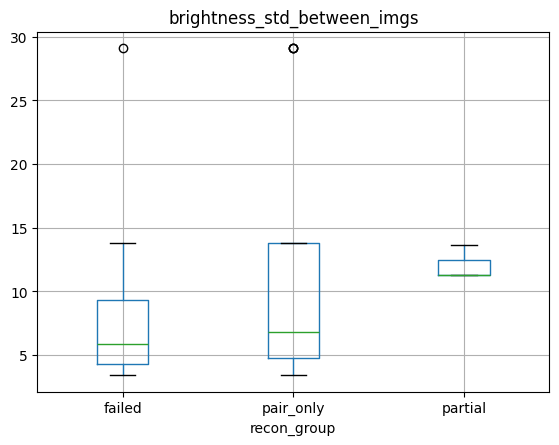

<Figure size 600x400 with 0 Axes>

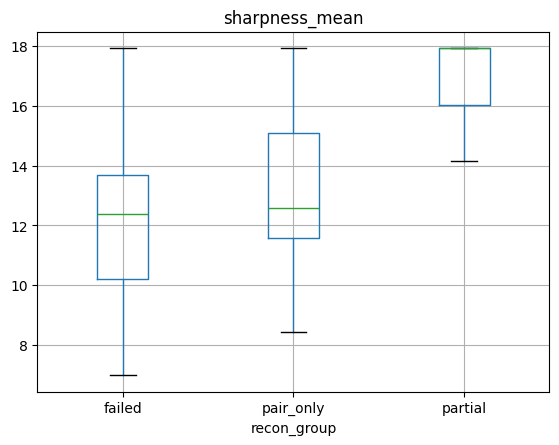

<Figure size 600x400 with 0 Axes>

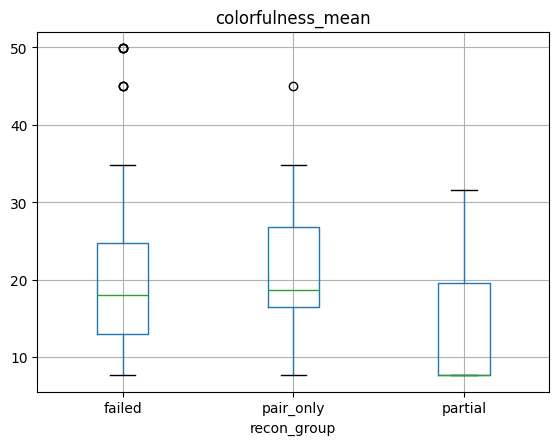

<Figure size 600x400 with 0 Axes>

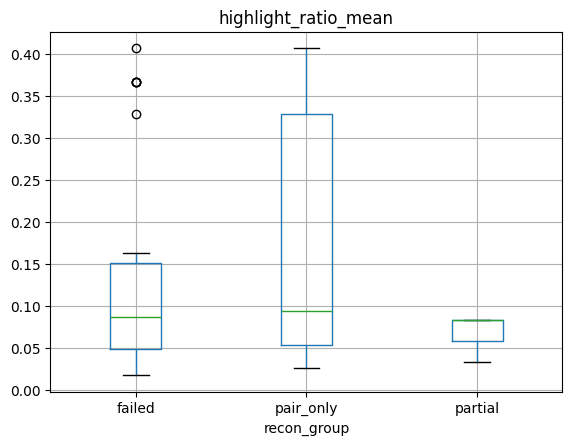

<Figure size 600x400 with 0 Axes>

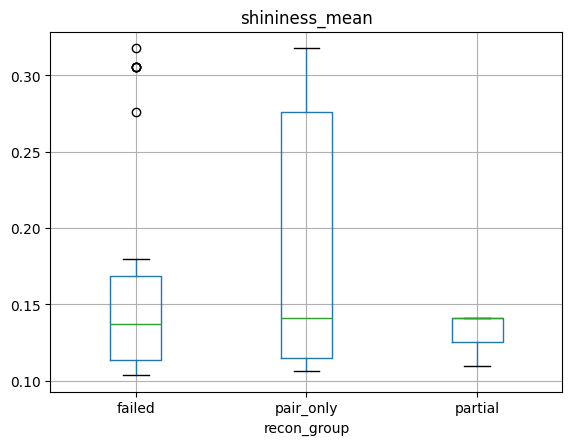

In [ ]:
import matplotlib.pyplot as plt

for col in metrics:
    plt.figure(figsize=(6, 4))
    merged.boxplot(column=col, by="recon_group")
    plt.title(col)
    plt.suptitle("")
    plt.show()

In [ ]:
from collections import defaultdict
import os

def extract_view_from_name(name):
    name = os.path.splitext(name)[0]
    parts = name.split("_")

    if len(parts) == 1:
        return parts[0]

    if parts[0] in ["FRONT", "REAR", "SIDE"]:
        if len(parts) >= 2:
            return f"{parts[0]}_{parts[1]}"

    return parts[0]


view_success = defaultdict(lambda: {"success": 0, "total": 0})

for _, row in merged.iterrows():
    run_dir = Path(row["run_dir"])
    images_txt = run_dir / "sparse_txt/images.txt"

    images = parse_colmap_images_txt(images_txt)

    if len(images) == 0:
        continue

    views = [extract_view_from_name(img["name"]) for img in images]
    unique_views = set(views)

    for v in unique_views:
        view_success[v]["total"] += 1

        if row["status"] == "ok" and row["n_registered_images"] >= 3:
            view_success[v]["success"] += 1


view_df = pd.DataFrame([
    {
        "view": v,
        "success": d["success"],
        "total": d["total"],
        "success_rate": d["success"] / d["total"] if d["total"] > 0 else 0
    }
    for v, d in view_success.items()
])

view_df = view_df.sort_values("success_rate", ascending=False)
display(view_df)

,view,success,total,success_rate
6,REAR,3,6,0.500000
2,FRONT,3,14,0.214286
3,FRONT_LEFT,3,15,0.200000
1,REAR_RIGHT,0,4,0.000000
0,REAR_LEFT,0,5,0.000000
4,FRONT_RIGHT,0,2,0.000000
5,SIDE_RIGHT,0,1,0.000000
